In [185]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')

In [186]:
df=pd.read_csv('patient_priority.csv')

In [187]:
df.head()

,Unnamed: 0,age,gender,chest pain type,blood pressure,cholesterol,max heart rate,exercise angina,plasma glucose,skin_thickness,insulin,bmi,diabetes_pedigree,hypertension,heart_disease,Residence_type,smoking_status,triage
0,0,40.0,1.0,2.0,140.0,294.0,172.0,0.0,108.0,43.0,92.0,19.0,0.467386,0.0,0.0,Urban,never smoked,yellow
1,1,49.0,0.0,3.0,160.0,180.0,156.0,0.0,75.0,47.0,90.0,18.0,0.467386,0.0,0.0,Urban,never smoked,orange
2,2,37.0,1.0,2.0,130.0,294.0,156.0,0.0,98.0,53.0,102.0,23.0,0.467386,0.0,0.0,Urban,never smoked,yellow
3,3,48.0,0.0,4.0,138.0,214.0,156.0,1.0,72.0,51.0,118.0,18.0,0.467386,0.0,0.0,Urban,never smoked,orange
4,4,54.0,1.0,3.0,150.0,195.0,156.0,0.0,108.0,90.0,83.0,21.0,0.467386,0.0,0.0,Urban,never smoked,yellow


In [188]:
df.shape

(6962, 18)

In [189]:
df.columns

Index(['Unnamed: 0', 'age', 'gender', 'chest pain type', 'blood pressure',
       'cholesterol', 'max heart rate', 'exercise angina', 'plasma glucose',
       'skin_thickness', 'insulin', 'bmi', 'diabetes_pedigree', 'hypertension',
       'heart_disease', 'Residence_type', 'smoking_status', 'triage'],
      dtype='object')

In [190]:
df.dtypes

Unnamed: 0             int64
age                  float64
gender               float64
chest pain type      float64
blood pressure       float64
cholesterol          float64
max heart rate       float64
exercise angina      float64
plasma glucose       float64
skin_thickness       float64
insulin              float64
bmi                  float64
diabetes_pedigree    float64
hypertension         float64
heart_disease        float64
Residence_type        object
smoking_status        object
triage                object
dtype: object

In [191]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6962 entries, 0 to 6961
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         6962 non-null   int64  
 1   age                6962 non-null   float64
 2   gender             6961 non-null   float64
 3   chest pain type    6962 non-null   float64
 4   blood pressure     6962 non-null   float64
 5   cholesterol        6962 non-null   float64
 6   max heart rate     6962 non-null   float64
 7   exercise angina    6962 non-null   float64
 8   plasma glucose     6962 non-null   float64
 9   skin_thickness     6962 non-null   float64
 10  insulin            6962 non-null   float64
 11  bmi                6962 non-null   float64
 12  diabetes_pedigree  6962 non-null   float64
 13  hypertension       6962 non-null   float64
 14  heart_disease      6962 non-null   float64
 15  Residence_type     6962 non-null   object 
 16  smoking_status     6962 

In [192]:
df.duplicated().sum()

0

In [193]:
df.isnull().values.any()

True

In [194]:
df.apply(pd.isnull).sum()

Unnamed: 0             0
age                    0
gender                 1
chest pain type        0
blood pressure         0
cholesterol            0
max heart rate         0
exercise angina        0
plasma glucose         0
skin_thickness         0
insulin                0
bmi                    0
diabetes_pedigree      0
hypertension           0
heart_disease          0
Residence_type         0
smoking_status         0
triage               410
dtype: int64

In [195]:
df.drop(columns=['Unnamed: 0','triage'],axis=1,inplace=True)

In [196]:
df.dropna(subset=['gender'],inplace=True)

In [197]:
df.isnull().sum()

age                  0
gender               0
chest pain type      0
blood pressure       0
cholesterol          0
max heart rate       0
exercise angina      0
plasma glucose       0
skin_thickness       0
insulin              0
bmi                  0
diabetes_pedigree    0
hypertension         0
heart_disease        0
Residence_type       0
smoking_status       0
dtype: int64

In [198]:
df.describe()

,age,gender,chest pain type,blood pressure,cholesterol,max heart rate,exercise angina,plasma glucose,skin_thickness,insulin,bmi,diabetes_pedigree,hypertension,heart_disease
count,6961.000000,6961.000000,6961.000000,6961.000000,6961.000000,6961.000000,6961.000000,6961.000000,6961.000000,6961.000000,6961.000000,6961.000000,6961.000000,6961.000000
mean,57.447924,0.531964,0.529091,109.633530,184.714840,163.500359,0.061773,98.387828,56.809079,111.090935,27.191596,0.467386,0.071541,0.039506
std,11.904525,0.499013,1.253865,21.534376,32.011288,15.458827,0.240760,28.595065,22.888100,17.471189,7.363191,0.102671,0.257746,0.194809
min,28.000000,0.000000,0.000000,60.000000,150.000000,138.000000,0.000000,55.120000,21.000000,81.000000,10.300000,0.078000,0.000000,0.000000
25%,48.000000,0.000000,0.000000,92.000000,164.000000,150.000000,0.000000,78.700000,36.000000,97.000000,21.800000,0.467386,0.000000,0.000000
50%,56.000000,1.000000,0.000000,111.000000,179.000000,163.000000,0.000000,93.000000,55.000000,111.000000,26.200000,0.467386,0.000000,0.000000
75%,66.000000,1.000000,0.000000,127.000000,192.000000,177.000000,0.000000,111.610000,77.000000,125.000000,31.000000,0.467386,0.000000,0.000000
max,82.000000,1.000000,4.000000,165.000000,294.000000,202.000000,1.000000,199.000000,99.000000,171.000000,66.800000,2.420000,1.000000,1.000000


In [199]:
df.shape

(6961, 16)

In [200]:
df['diabetes_pedigree'].value_counts()

diabetes_pedigree
0.467386    6246
0.254000       6
0.258000       5
0.261000       5
0.207000       5
            ... 
0.078000       1
1.101000       1
0.933000       1
0.997000       1
0.171000       1
Name: count, Length: 491, dtype: int64

In [201]:
df['heart_disease'].value_counts()

heart_disease
0.0    6686
1.0     275
Name: count, dtype: int64

In [202]:
df['hypertension'].value_counts()

hypertension
0.0    6463
1.0     498
Name: count, dtype: int64

In [203]:
df['exercise angina'].value_counts()

exercise angina
0.0    6531
1.0     430
Name: count, dtype: int64

In [204]:
df.drop(columns=['diabetes_pedigree','heart_disease','hypertension','exercise angina'],axis=1,inplace=True)

In [205]:
df.head()

,age,gender,chest pain type,blood pressure,cholesterol,max heart rate,plasma glucose,skin_thickness,insulin,bmi,Residence_type,smoking_status
0,40.0,1.0,2.0,140.0,294.0,172.0,108.0,43.0,92.0,19.0,Urban,never smoked
1,49.0,0.0,3.0,160.0,180.0,156.0,75.0,47.0,90.0,18.0,Urban,never smoked
2,37.0,1.0,2.0,130.0,294.0,156.0,98.0,53.0,102.0,23.0,Urban,never smoked
3,48.0,0.0,4.0,138.0,214.0,156.0,72.0,51.0,118.0,18.0,Urban,never smoked
4,54.0,1.0,3.0,150.0,195.0,156.0,108.0,90.0,83.0,21.0,Urban,never smoked


In [206]:
df.shape

(6961, 12)

In [207]:
df.groupby('gender').mean(numeric_only=True)

,age,chest pain type,blood pressure,cholesterol,max heart rate,plasma glucose,skin_thickness,insulin,bmi
gender,,,,,,,,,
0.0,58.899939,0.241252,111.957336,180.501535,164.545734,94.504607,59.350522,110.351443,28.355402
1.0,56.170402,0.782339,107.588982,188.421820,162.580610,101.804391,54.573049,111.741561,26.167648


In [208]:
df.groupby('chest pain type').mean(numeric_only=True)

,age,gender,blood pressure,cholesterol,max heart rate,plasma glucose,skin_thickness,insulin,bmi
chest pain type,,,,,,,,,
0.0,58.212298,0.485915,105.609584,174.498626,164.668327,98.587886,56.096359,111.364651,28.511113
1.0,55.150000,0.783333,134.416667,232.233333,161.933333,97.400000,62.750000,109.350000,20.183333
2.0,49.588517,0.641148,128.282297,242.306220,160.593301,97.813397,59.200957,109.004785,20.478469
3.0,53.309091,0.690909,129.803636,235.960000,158.989091,96.345455,60.290909,110.883636,20.523636
4.0,54.873950,0.845378,130.635294,235.973109,155.336134,97.675630,60.734454,109.416807,20.426891


In [209]:
df.groupby('Residence_type').mean(numeric_only=True)

,age,gender,chest pain type,blood pressure,cholesterol,max heart rate,plasma glucose,skin_thickness,insulin,bmi
Residence_type,,,,,,,,,,
Rural,59.240844,0.417197,0.000000,110.258360,174.852707,164.945462,95.571716,60.016720,110.569268,28.841998
Urban,56.435604,0.596763,0.827826,109.280737,190.283210,162.684423,99.977865,54.997977,111.385480,26.259744


In [210]:
df.groupby('smoking_status').mean(numeric_only=True)

,age,gender,chest pain type,blood pressure,cholesterol,max heart rate,plasma glucose,skin_thickness,insulin,bmi
smoking_status,,,,,,,,,,
Unknown,59.027202,0.458549,0.000000,109.690415,174.788212,164.690415,94.277390,59.595855,110.739637,25.806218
formerly smoked,61.250283,0.459796,0.000000,110.200453,174.291053,164.032843,95.932933,59.758777,110.469989,30.715968
never smoked,55.818959,0.601335,0.983445,109.325768,193.527103,162.510814,101.149290,54.363685,111.594660,26.258398
smokes,57.833967,0.427123,0.000000,110.348542,173.978454,165.272497,96.071622,59.661597,110.082383,30.387833


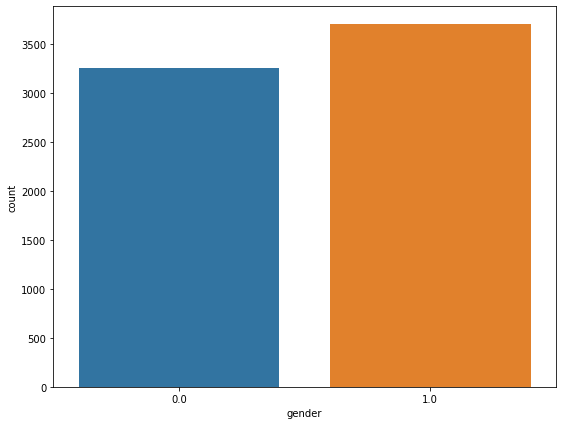

In [211]:
plt.figure(figsize=(9,7))
sns.countplot(data=df,x='gender')
plt.show()

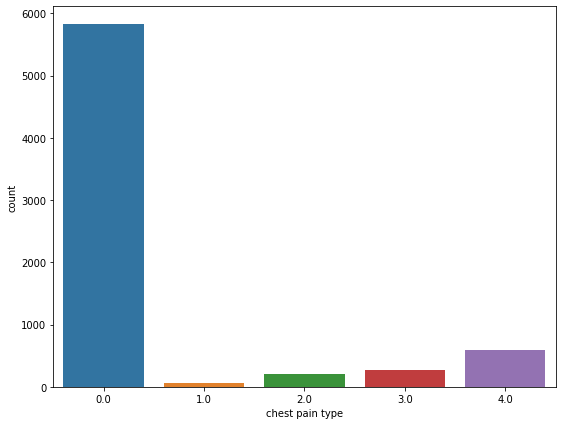

In [212]:
plt.figure(figsize=(9,7))
sns.countplot(data=df,x='chest pain type')
plt.show()

In [213]:
df['chest pain type'].value_counts()

chest pain type
0.0    5822
4.0     595
3.0     275
2.0     209
1.0      60
Name: count, dtype: int64

In [214]:
df.drop(columns=['chest pain type'],axis='columns',inplace=True)

In [215]:
df.head()

,age,gender,blood pressure,cholesterol,max heart rate,plasma glucose,skin_thickness,insulin,bmi,Residence_type,smoking_status
0,40.0,1.0,140.0,294.0,172.0,108.0,43.0,92.0,19.0,Urban,never smoked
1,49.0,0.0,160.0,180.0,156.0,75.0,47.0,90.0,18.0,Urban,never smoked
2,37.0,1.0,130.0,294.0,156.0,98.0,53.0,102.0,23.0,Urban,never smoked
3,48.0,0.0,138.0,214.0,156.0,72.0,51.0,118.0,18.0,Urban,never smoked
4,54.0,1.0,150.0,195.0,156.0,108.0,90.0,83.0,21.0,Urban,never smoked


In [216]:
cols1=['blood pressure','cholesterol','max heart rate','plasma glucose','skin_thickness','insulin','bmi']

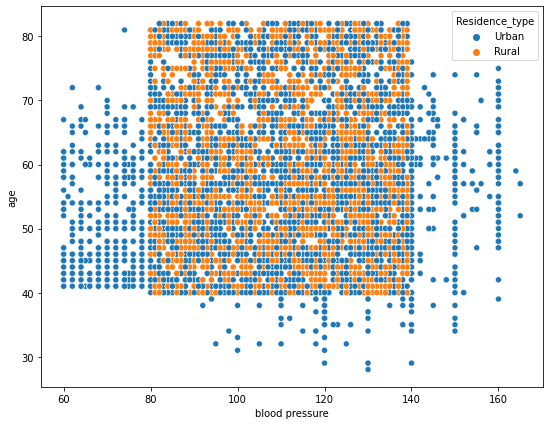

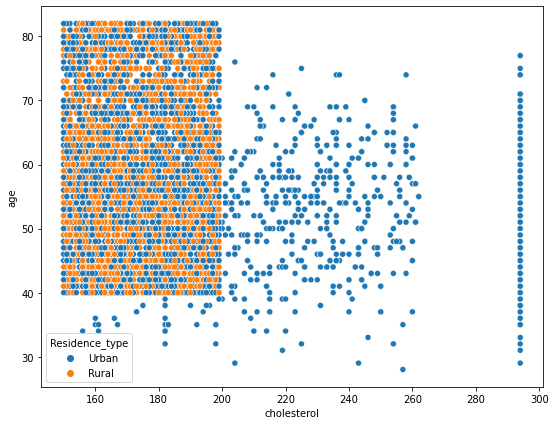

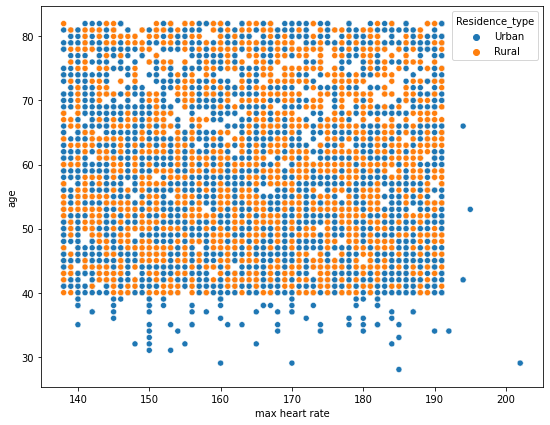

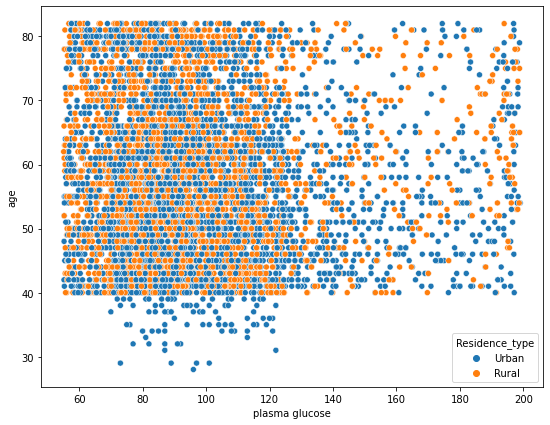

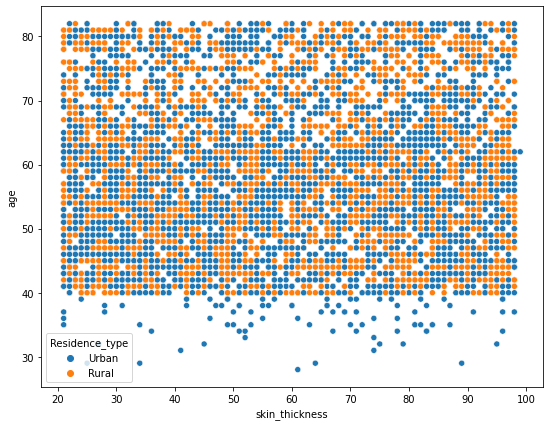

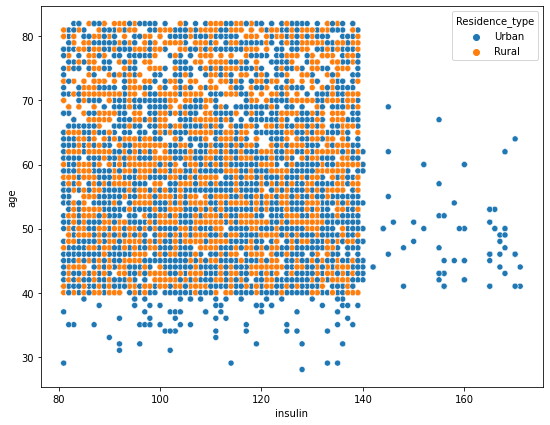

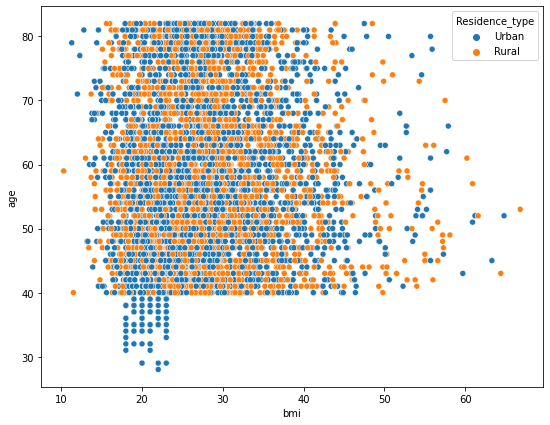

In [217]:
for i in cols1:
    plt.figure(figsize=(9,7))
    sns.scatterplot(data=df,x=i,y='age',hue='Residence_type')
    plt.show()

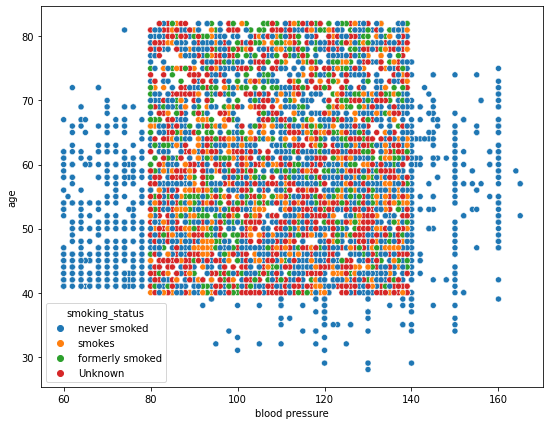

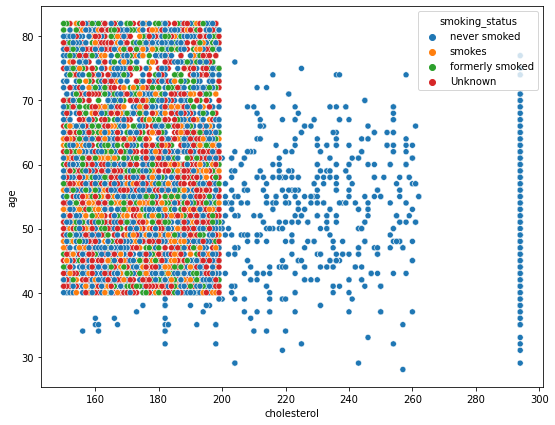

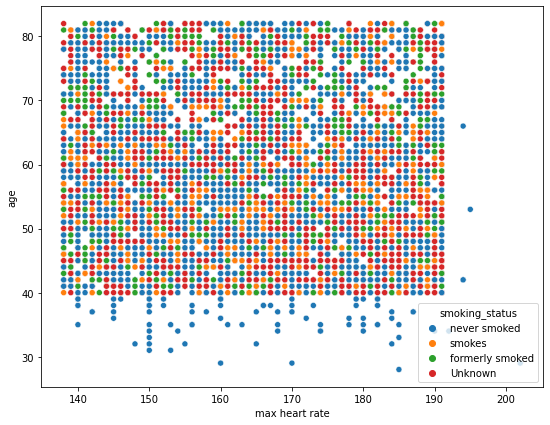

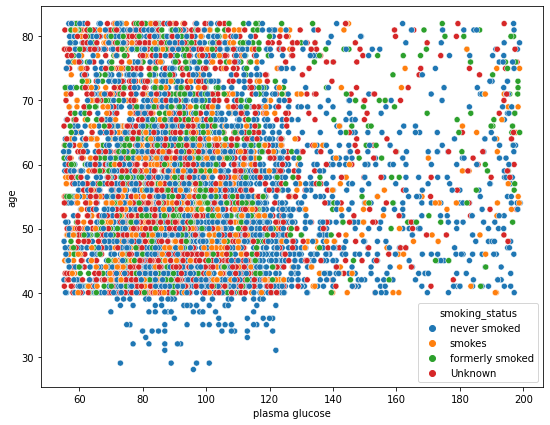

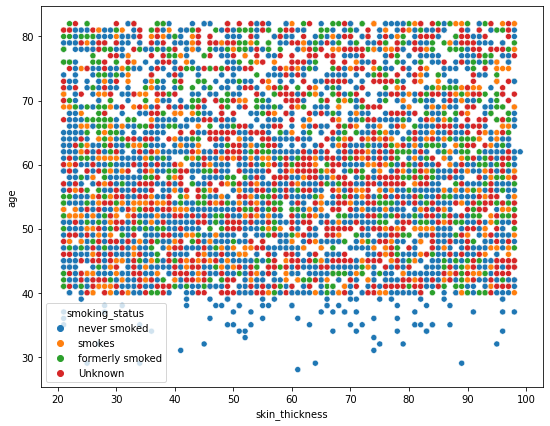

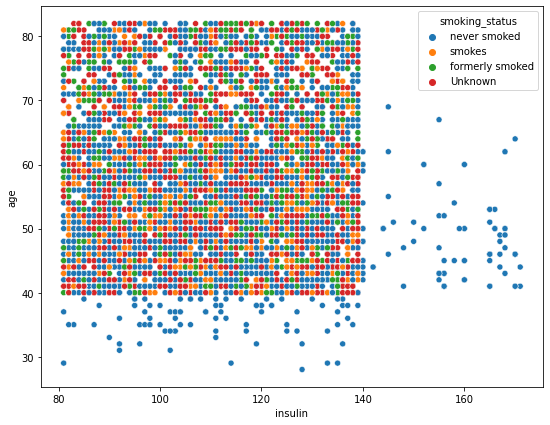

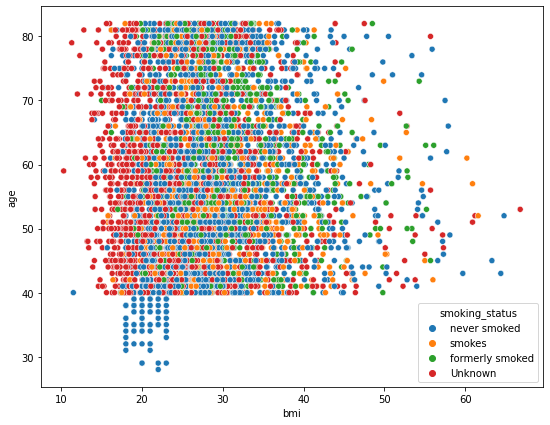

In [218]:
for i in cols1:
    plt.figure(figsize=(9,7))
    sns.scatterplot(data=df,x=i,y='age',hue='smoking_status')
    plt.show()

In [219]:
cols2=['cholesterol','max heart rate','plasma glucose','insulin','bmi']

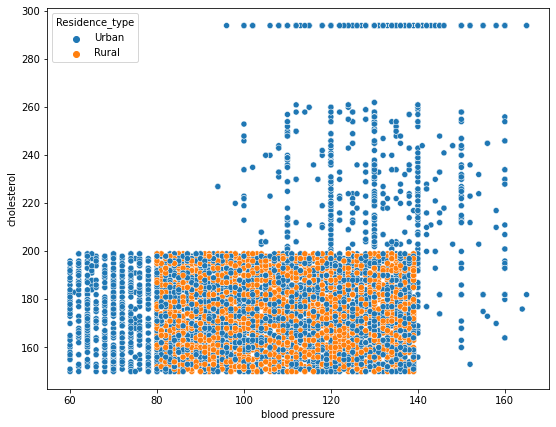

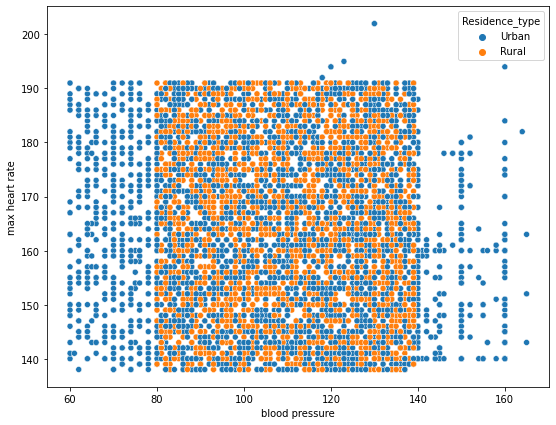

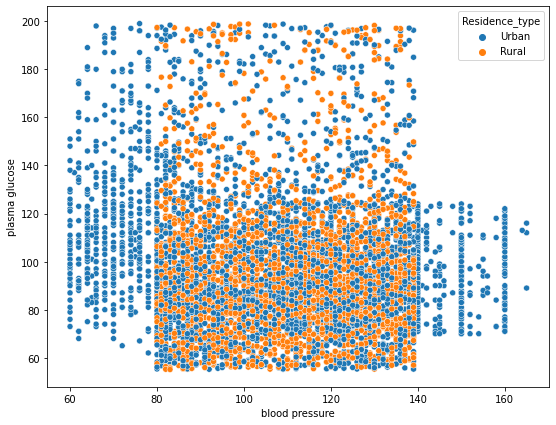

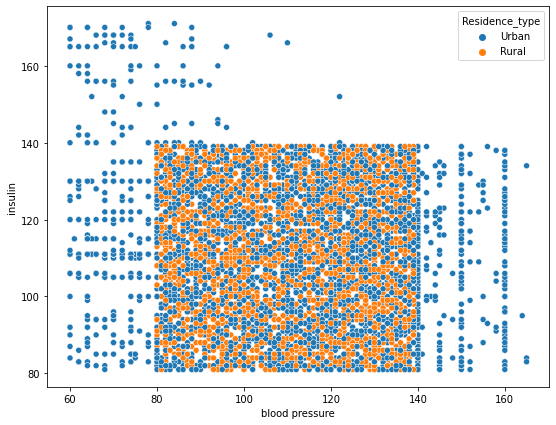

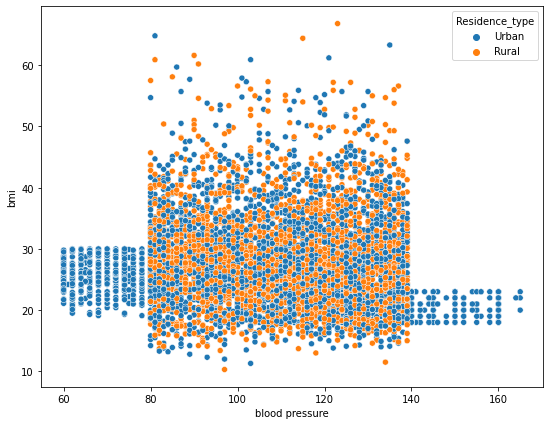

In [220]:
for i in cols2:
    plt.figure(figsize=(9,7))
    sns.scatterplot(data=df,x='blood pressure',y=i,hue='Residence_type')
    plt.show()

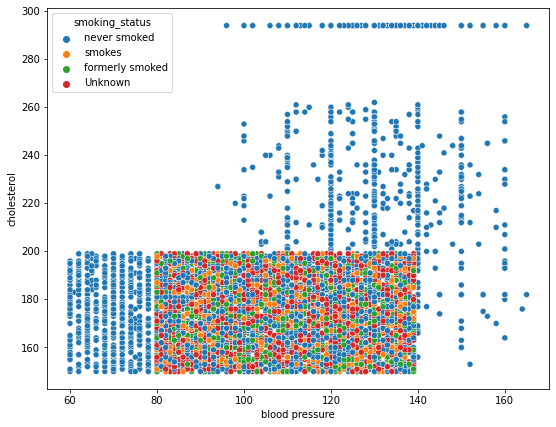

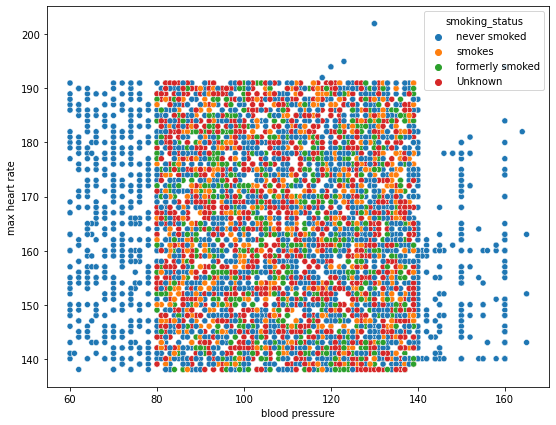

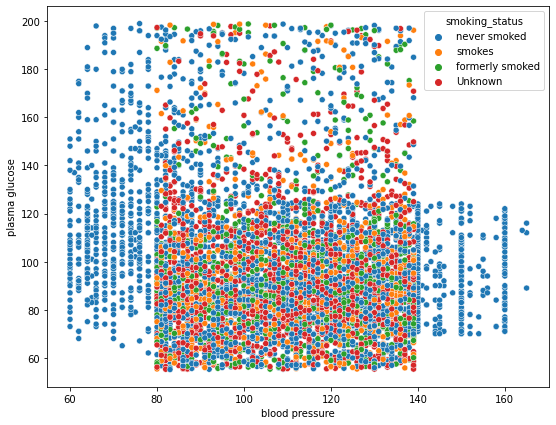

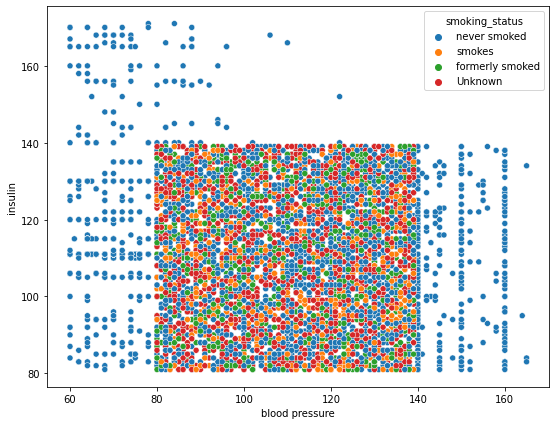

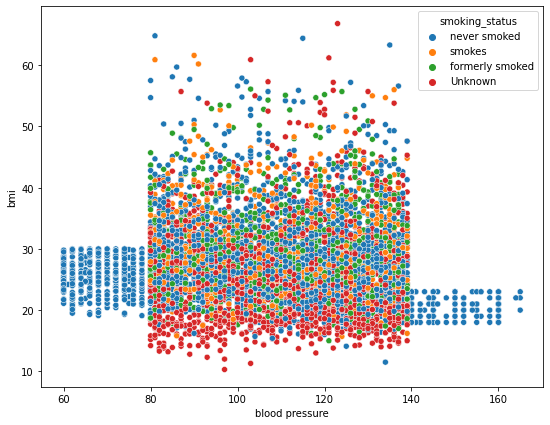

In [221]:
for i in cols2:
    plt.figure(figsize=(9,7))
    sns.scatterplot(data=df,x='blood pressure',y=i,hue='smoking_status')
    plt.show()

In [222]:
cols3=['max heart rate','plasma glucose','insulin','bmi']

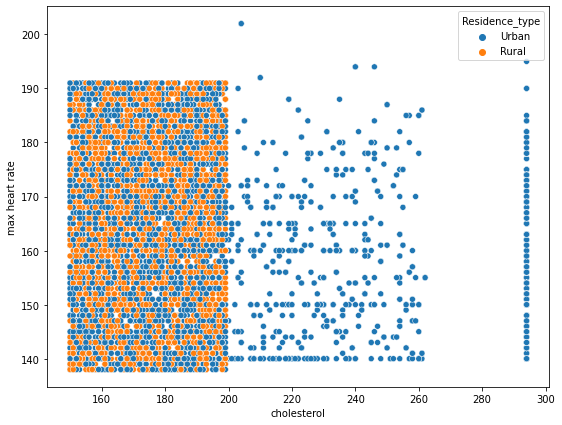

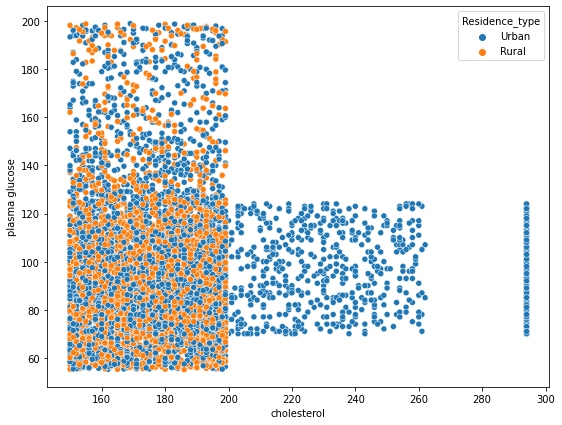

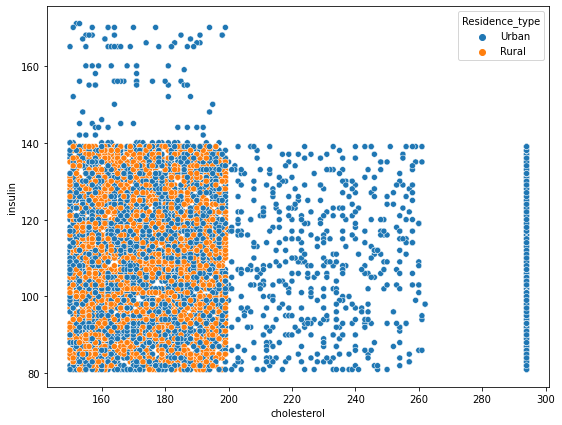

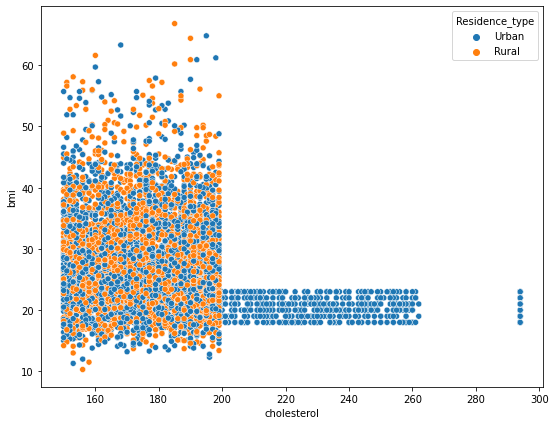

In [223]:
for i in cols3:
    plt.figure(figsize=(9,7))
    sns.scatterplot(data=df,x='cholesterol',y=i,hue='Residence_type')
    plt.show()

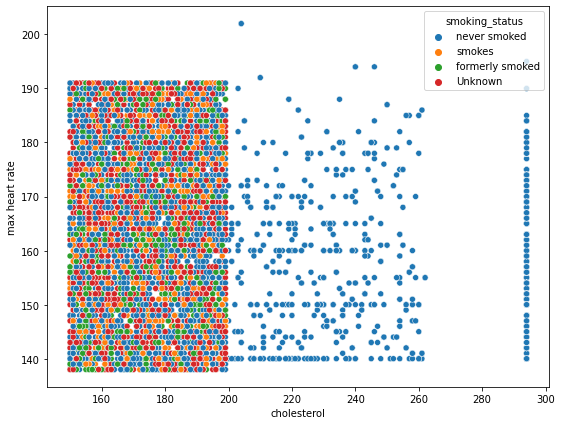

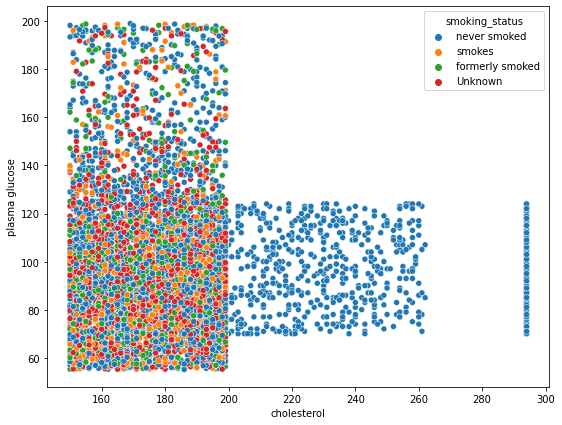

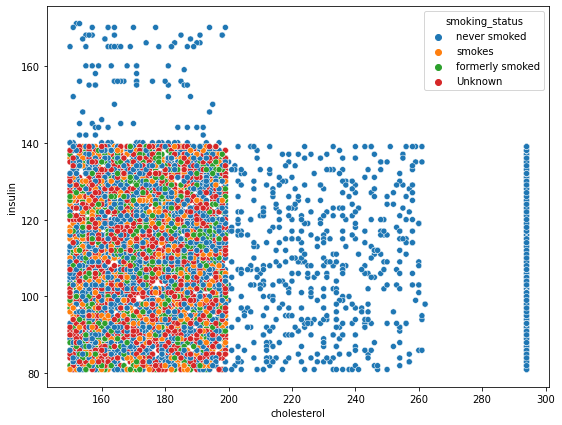

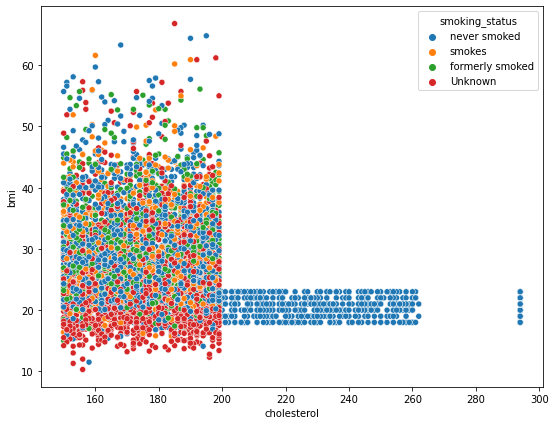

In [224]:
for i in cols3:
    plt.figure(figsize=(9,7))
    sns.scatterplot(data=df,x='cholesterol',y=i,hue='smoking_status')
    plt.show()

In [225]:
cols4=['plasma glucose','insulin','bmi']

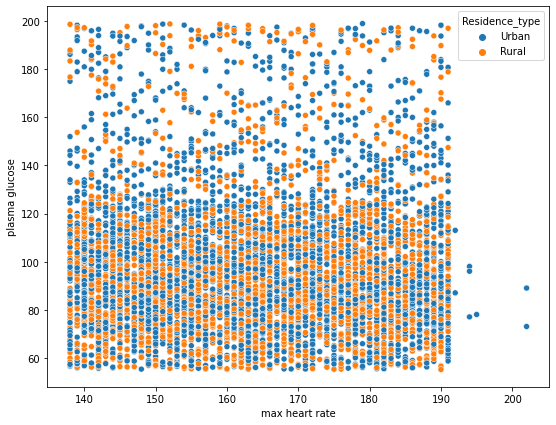

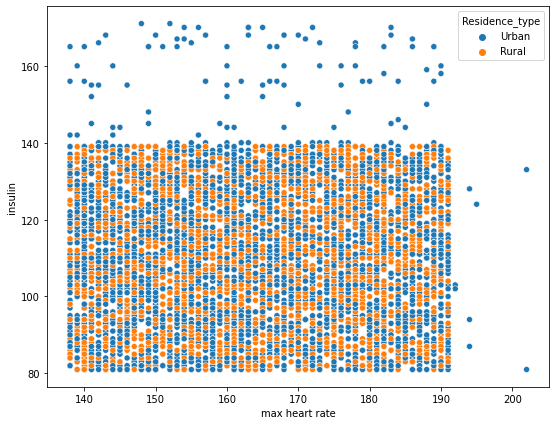

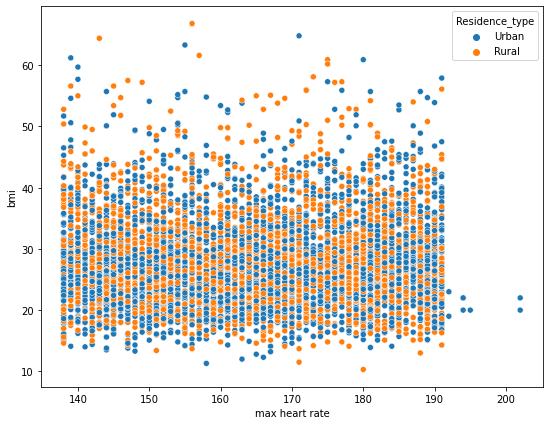

In [226]:
for i in cols4:
    plt.figure(figsize=(9,7))
    sns.scatterplot(data=df,x='max heart rate',y=i,hue='Residence_type')
    plt.show()

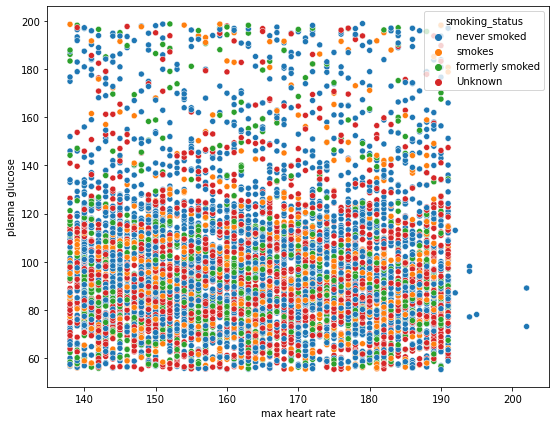

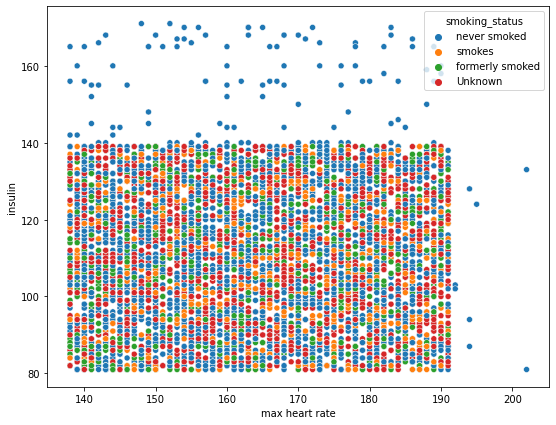

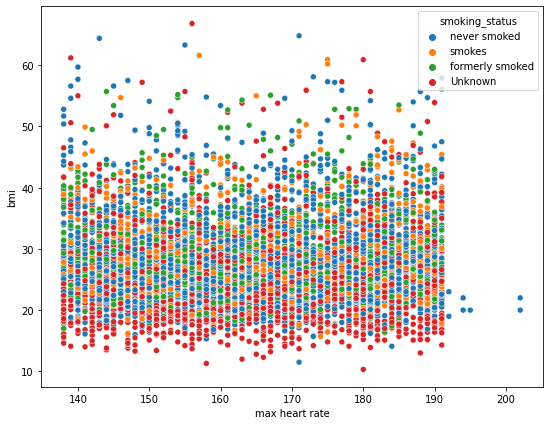

In [227]:
for i in cols4:
    plt.figure(figsize=(9,7))
    sns.scatterplot(data=df,x='max heart rate',y=i,hue='smoking_status')
    plt.show()

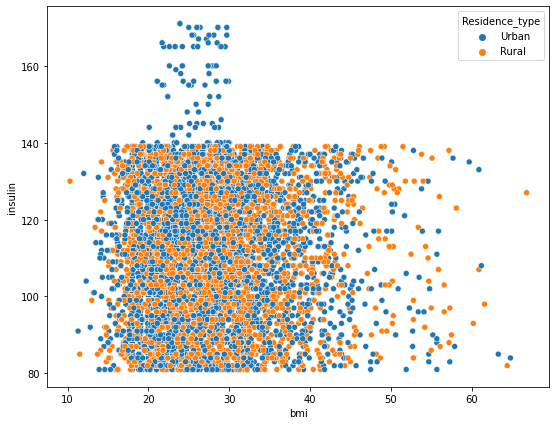

In [228]:
plt.figure(figsize=(9,7))
sns.scatterplot(data=df,x='bmi',y='insulin',hue='Residence_type')
plt.show()

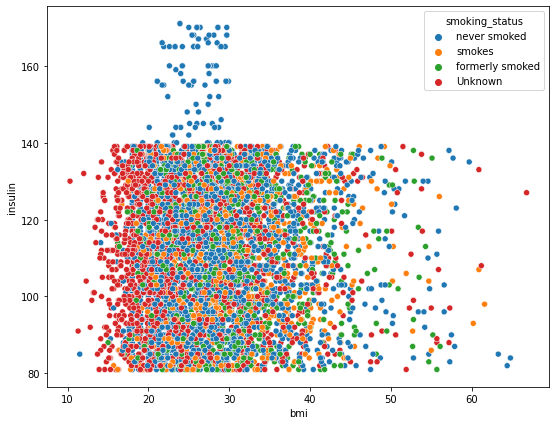

In [229]:
plt.figure(figsize=(9,7))
sns.scatterplot(data=df,x='bmi',y='insulin',hue='smoking_status')
plt.show()

In [230]:
cols5=['insulin','bmi']

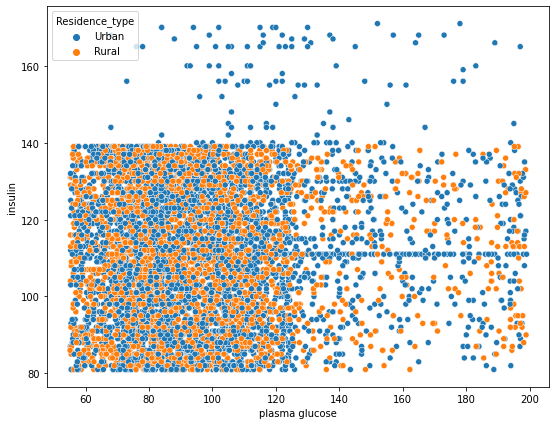

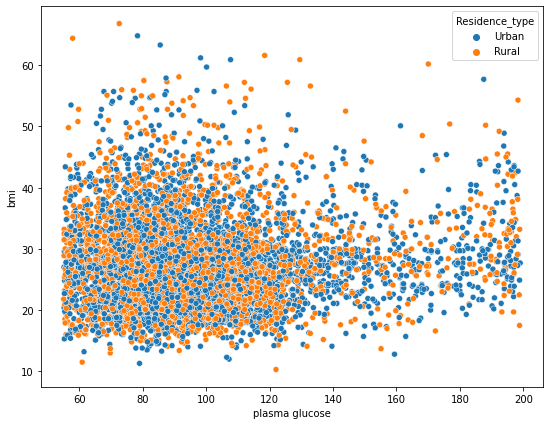

In [231]:
for i in cols5:
    plt.figure(figsize=(9,7))
    sns.scatterplot(data=df,x='plasma glucose',y=i,hue='Residence_type')
    plt.show()

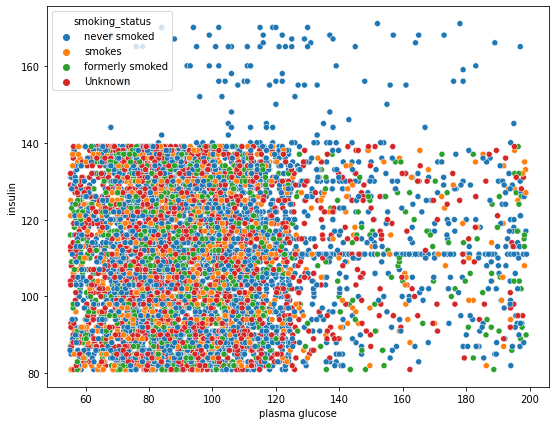

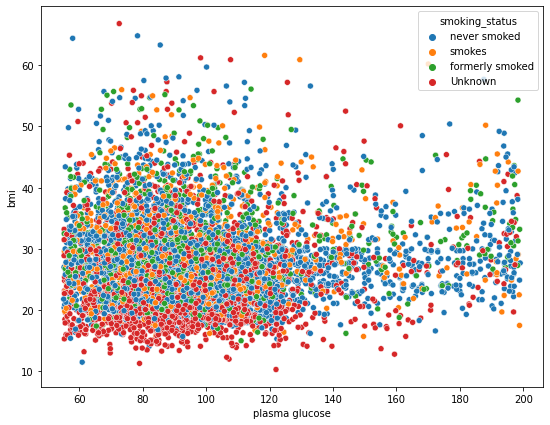

In [232]:
for i in cols5:
    plt.figure(figsize=(9,7))
    sns.scatterplot(data=df,x='plasma glucose',y=i,hue='smoking_status')
    plt.show()

In [233]:
cols6=['age','gender','blood pressure','cholesterol','max heart rate','plasma glucose','skin_thickness','insulin','bmi']
cols7=['Residence_type','smoking_status']

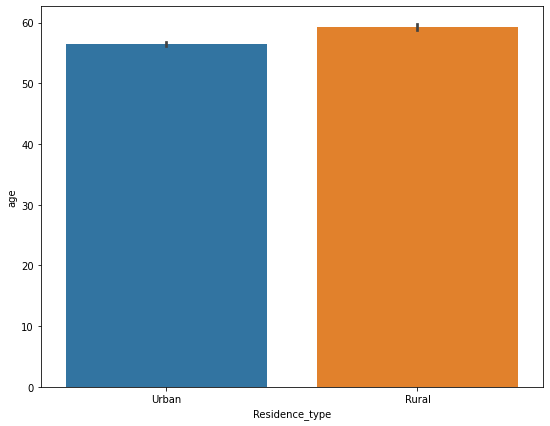

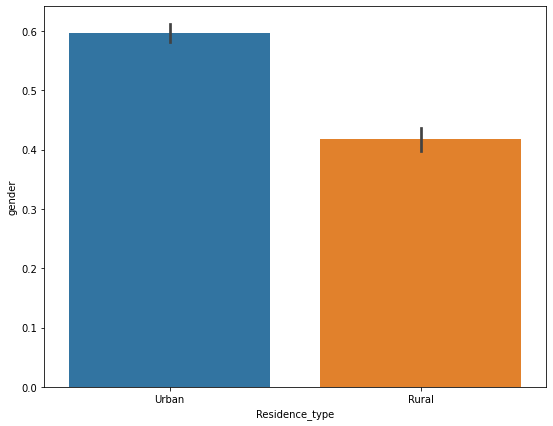

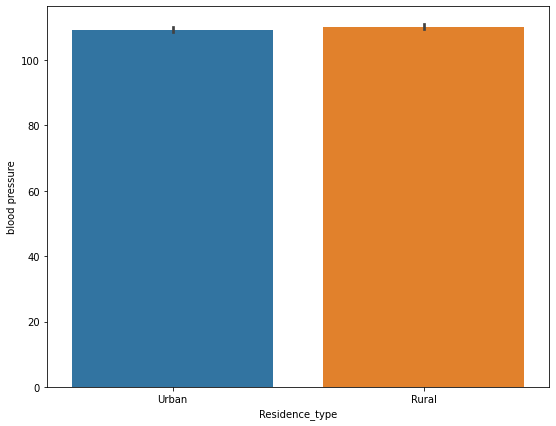

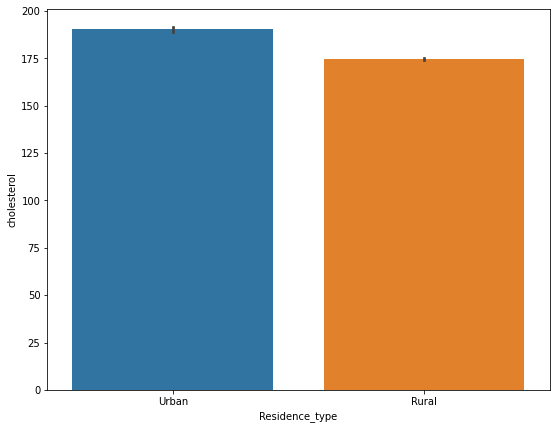

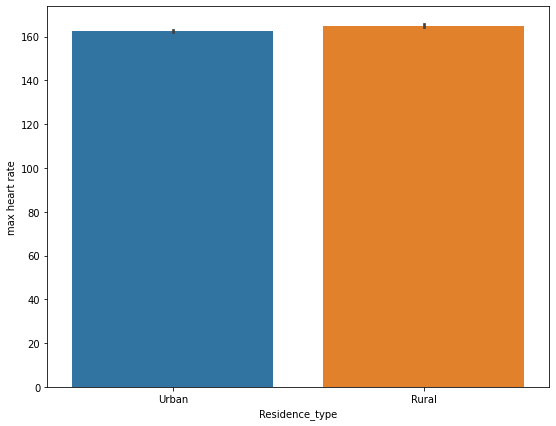

...

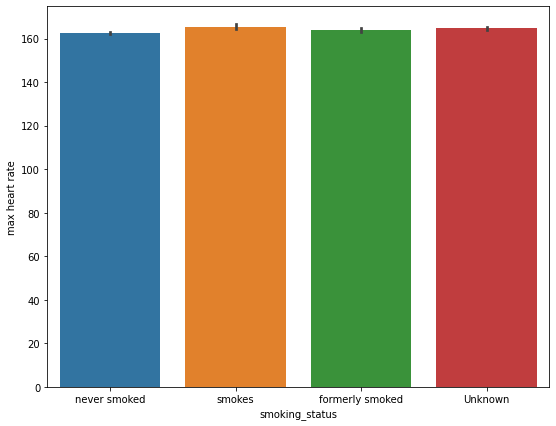

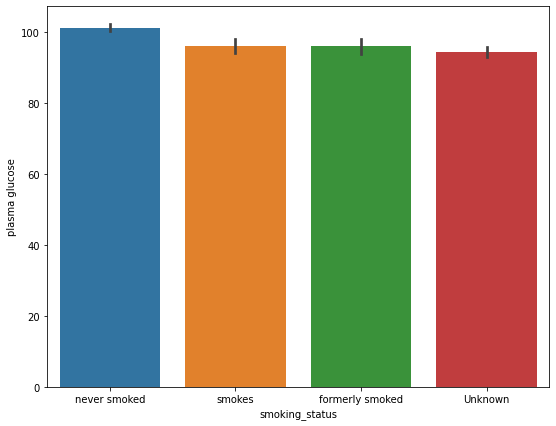

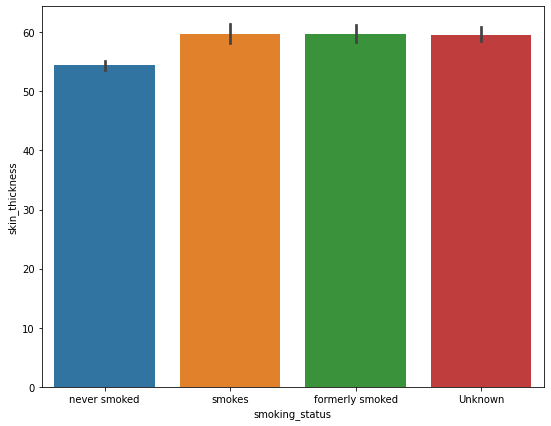

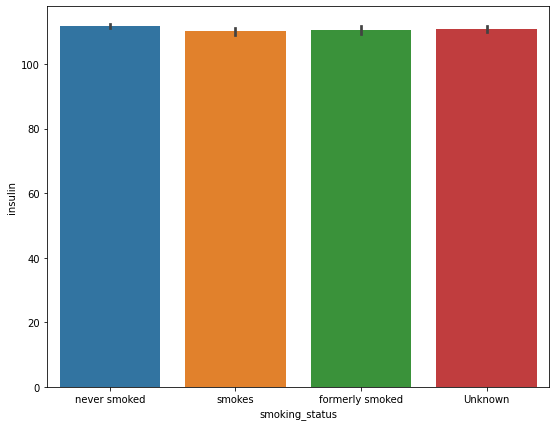

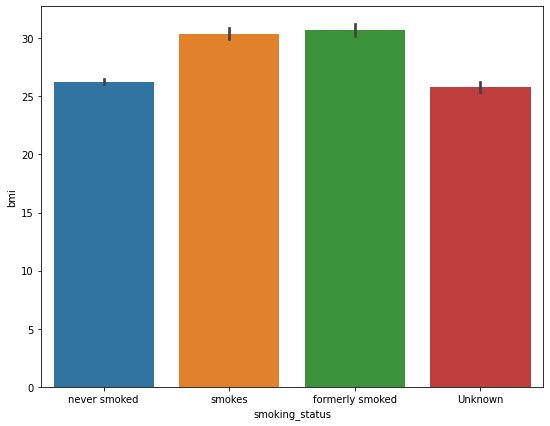

In [234]:
for i in cols7:
    for j in cols6:
        plt.figure(figsize=(9,7))
        sns.barplot(data=df,x=i,y=j)
        plt.show()

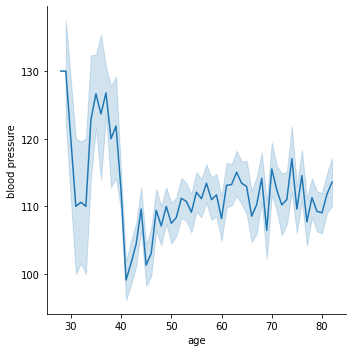

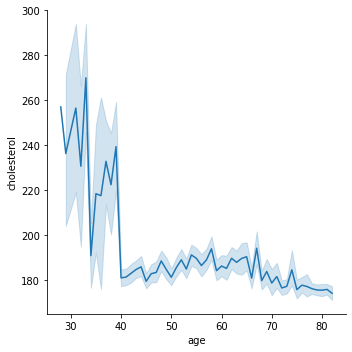

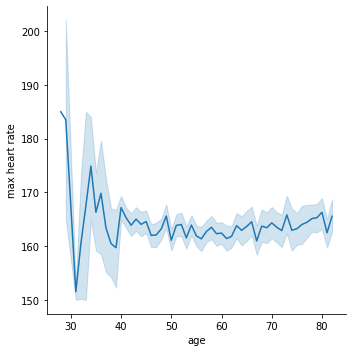

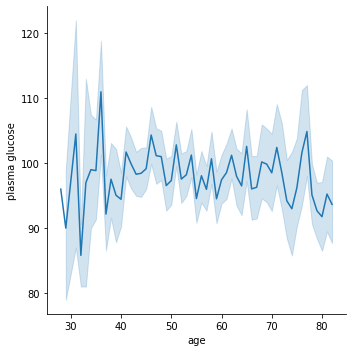

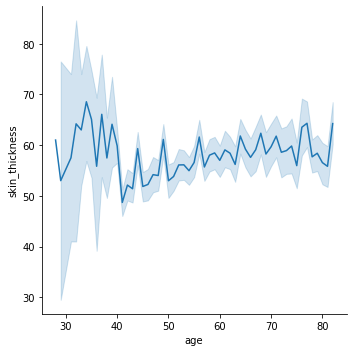

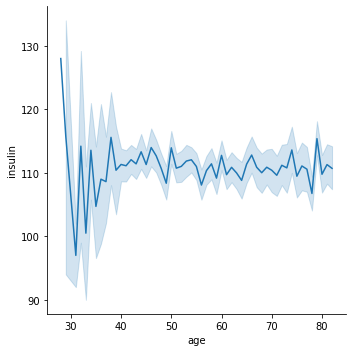

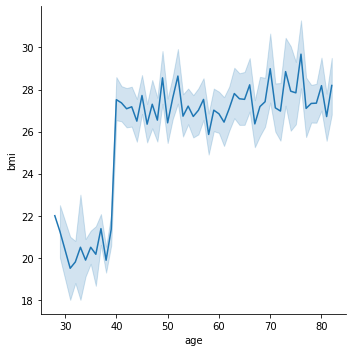

In [235]:
for i in cols1:
    sns.relplot(data=df,x='age',y=i,kind='line')
    plt.show()

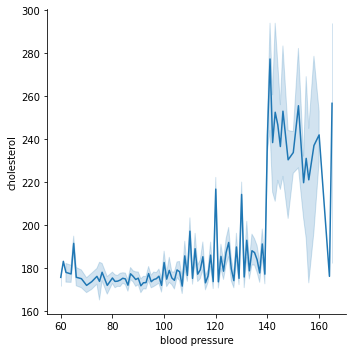

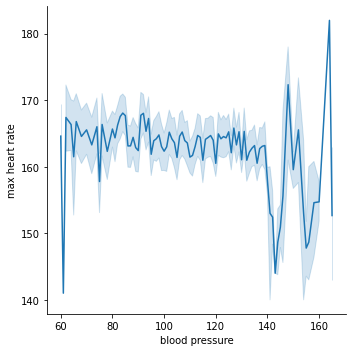

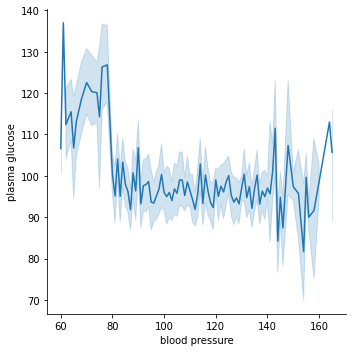

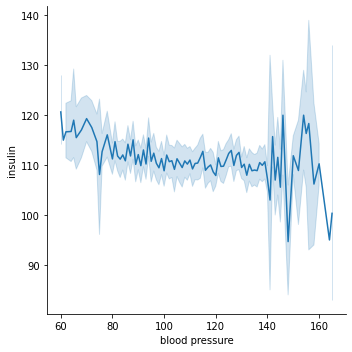

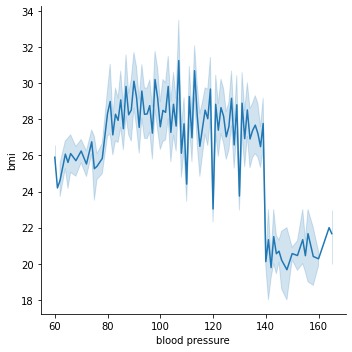

In [236]:
for i in cols2:
    sns.relplot(data=df,x='blood pressure',y=i,kind='line')
    plt.show()

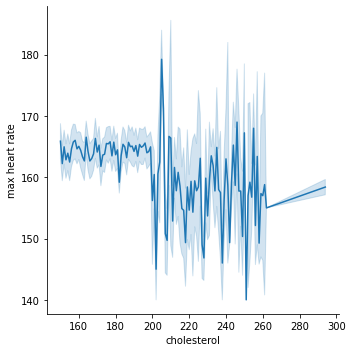

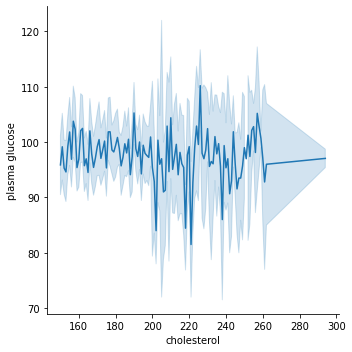

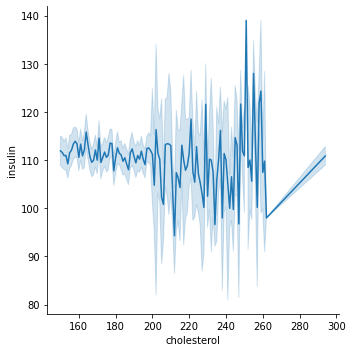

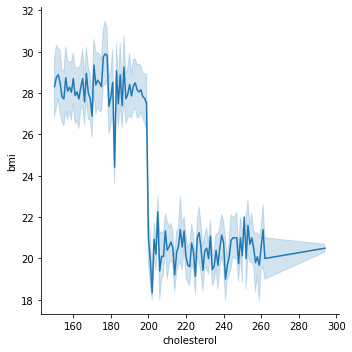

In [237]:
for i in cols3:
    sns.relplot(data=df,x='cholesterol',y=i,kind='line')
    plt.show()

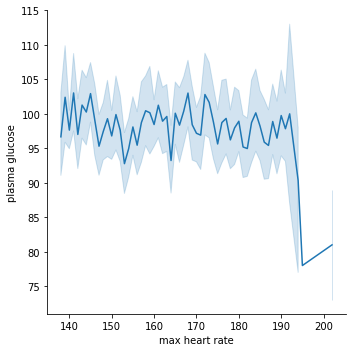

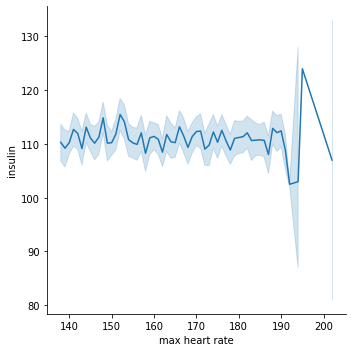

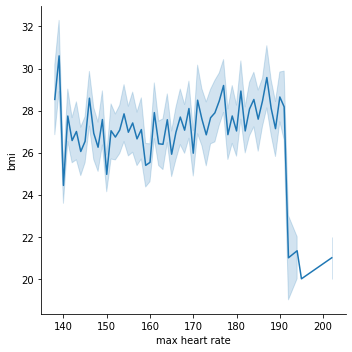

In [238]:
for i in cols4:
    sns.relplot(data=df,x='max heart rate',y=i,kind='line')
    plt.show()

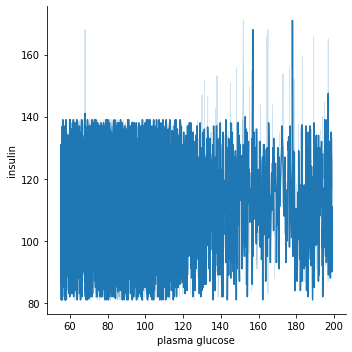

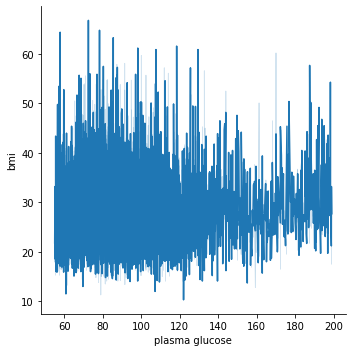

In [239]:
for i in cols5:
    sns.relplot(data=df,x='plasma glucose',y=i,kind='line')
    plt.show()

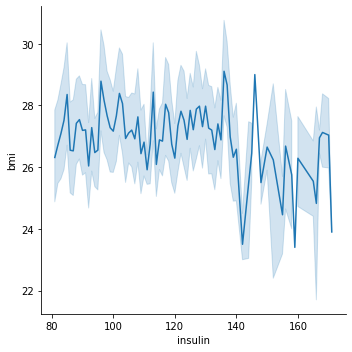

In [240]:
sns.relplot(data=df,x='insulin',y='bmi',kind='line')
plt.show()

In [241]:
cols8=['age','blood pressure','cholesterol','max heart rate','plasma glucose','skin_thickness','insulin','bmi']

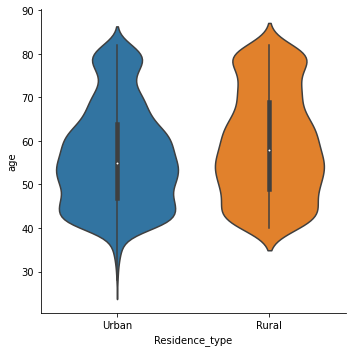

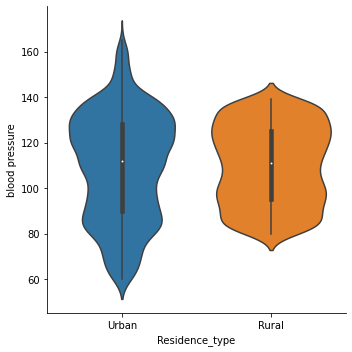

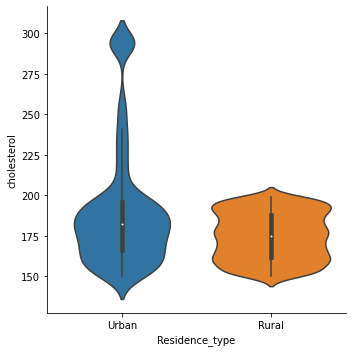

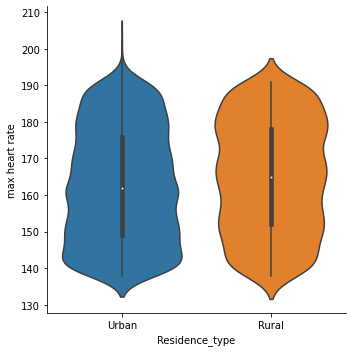

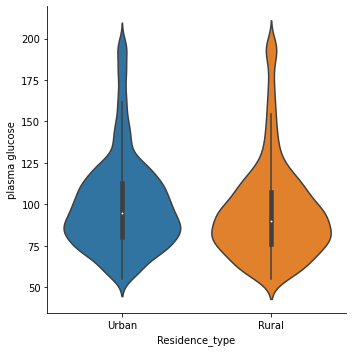

...

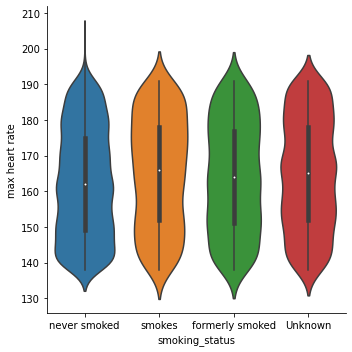

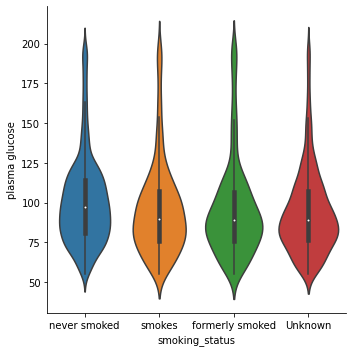

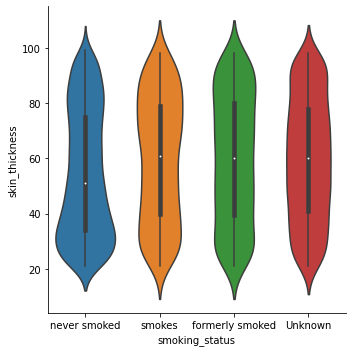

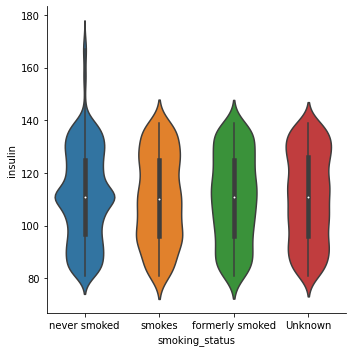

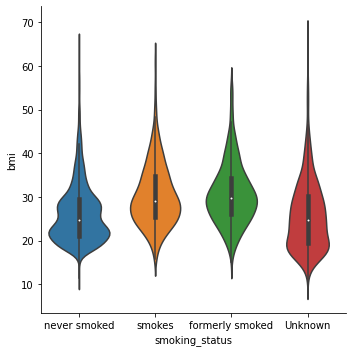

In [242]:
for i in cols7:
    for j in cols8:
        sns.catplot(data=df,x=i,y=j,kind='violin')
        plt.show()

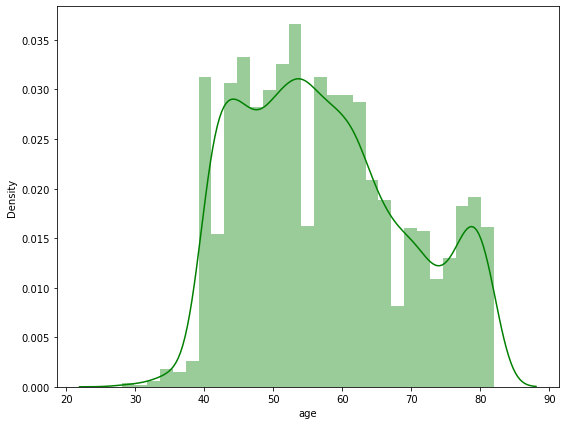

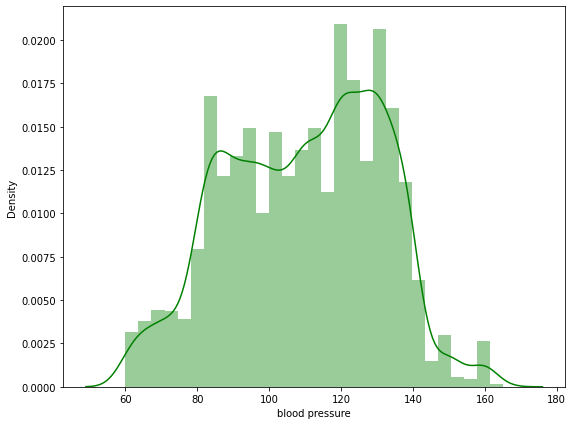

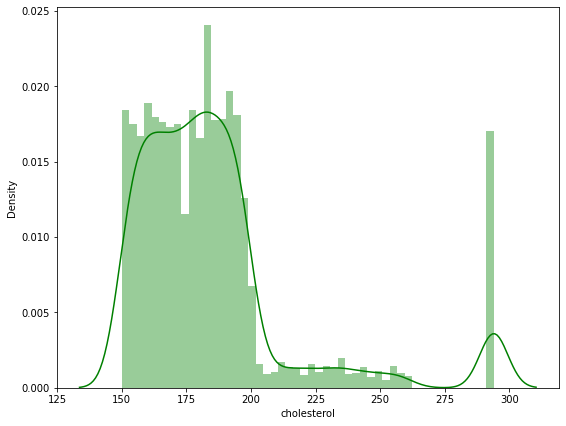

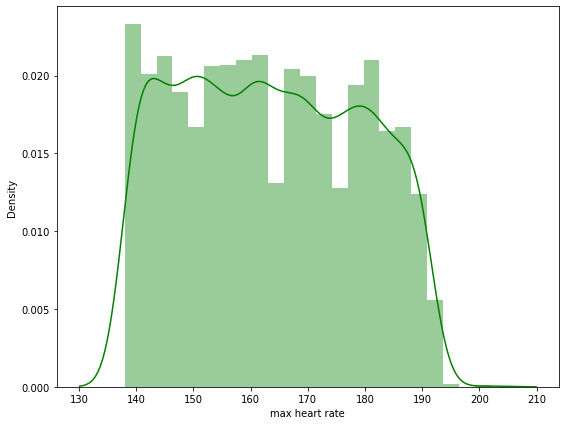

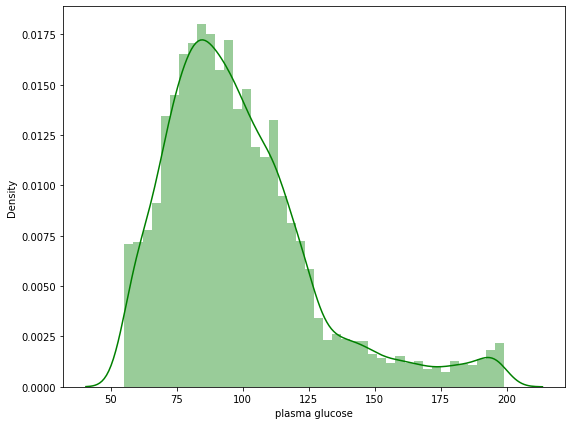

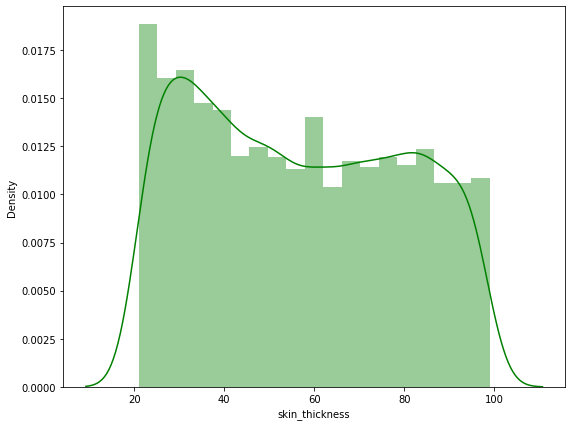

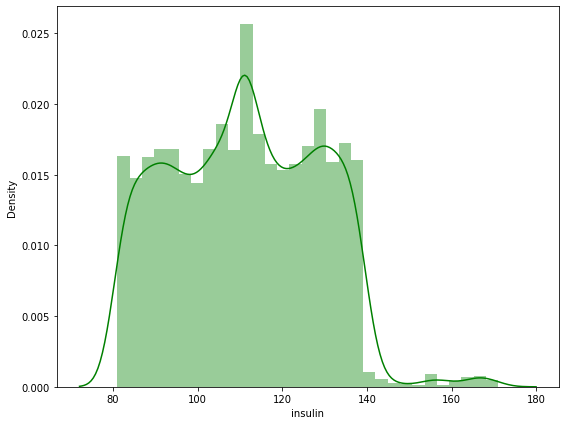

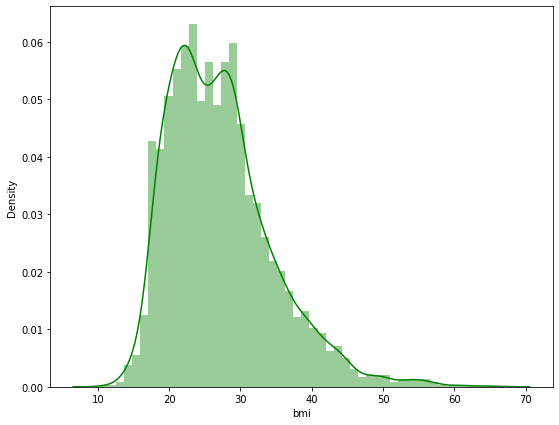

In [243]:
for i in cols8:
    plt.figure(figsize=(9,7))
    sns.distplot(df[i],color='green')
    plt.show()

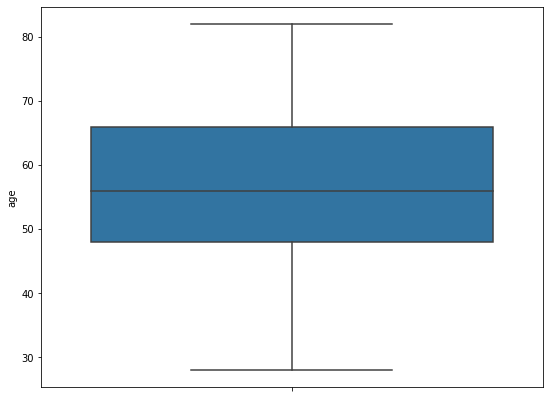

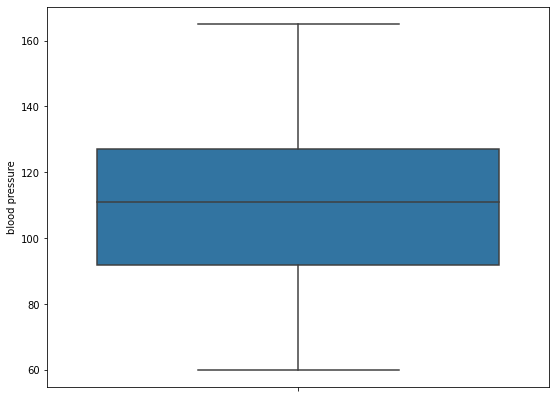

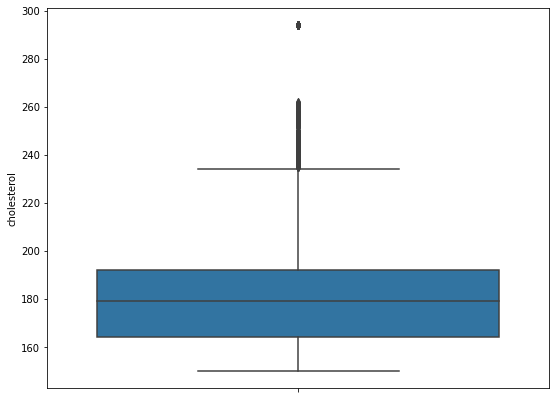

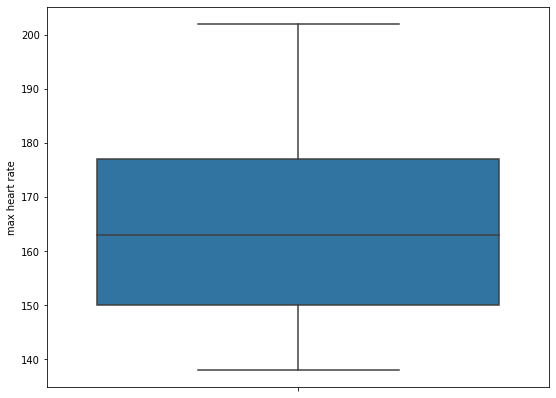

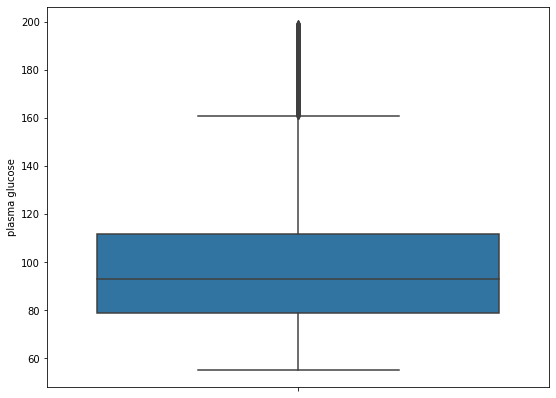

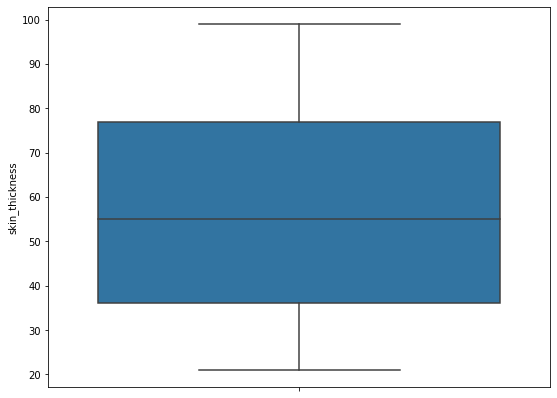

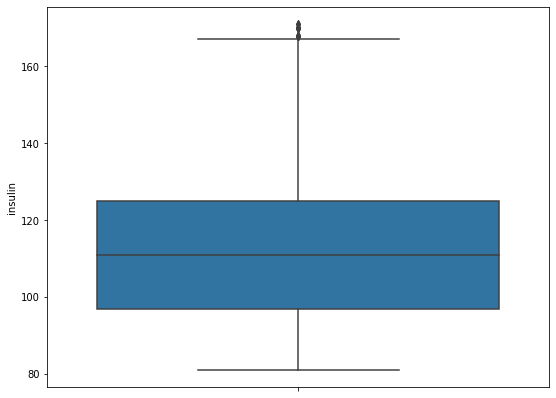

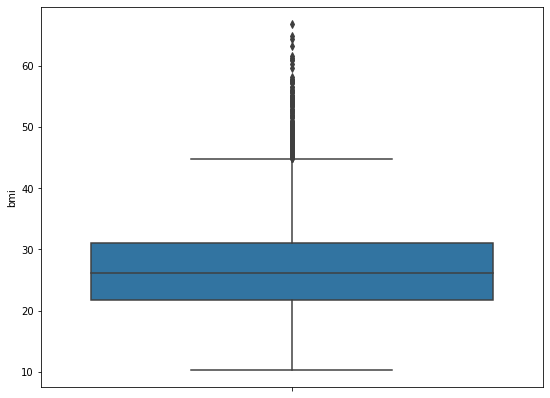

In [244]:
for column in cols8:
    plt.figure(figsize=(9,7))
    sns.boxplot(data=df,y=column)
    plt.show()

In [245]:
df[df['cholesterol']>232].shape

(571, 11)

In [246]:
df.shape

(6961, 11)

In [247]:
df=df[df['cholesterol']<232]

In [248]:
df[df['plasma glucose']>160].shape

(342, 11)

In [249]:
df=df[df['plasma glucose']<160]

In [250]:
df[df['insulin']>165].shape

(21, 11)

In [251]:
df=df[df['insulin']<165]

In [252]:
df[df['bmi']>44].shape

(171, 11)

In [253]:
df=df[df['bmi']<44]

In [254]:
df.shape

(5833, 11)

In [255]:
df.head()

,age,gender,blood pressure,cholesterol,max heart rate,plasma glucose,skin_thickness,insulin,bmi,Residence_type,smoking_status
1,49.0,0.0,160.0,180.0,156.0,75.0,47.0,90.0,18.0,Urban,never smoked
3,48.0,0.0,138.0,214.0,156.0,72.0,51.0,118.0,18.0,Urban,never smoked
4,54.0,1.0,150.0,195.0,156.0,108.0,90.0,83.0,21.0,Urban,never smoked
7,54.0,1.0,110.0,208.0,142.0,124.0,82.0,103.0,19.0,Urban,never smoked
8,37.0,1.0,140.0,207.0,142.0,84.0,67.0,120.0,22.0,Urban,never smoked


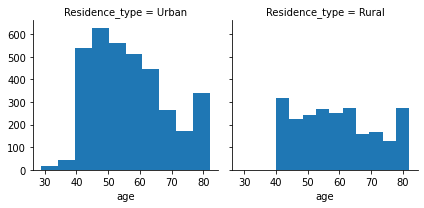

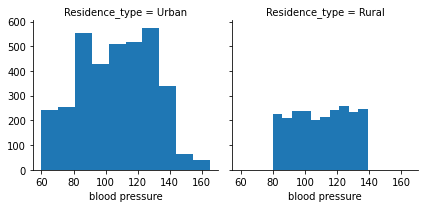

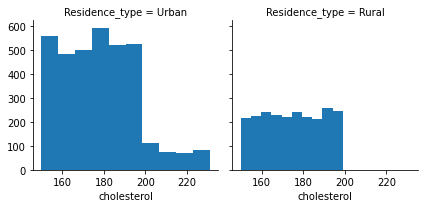

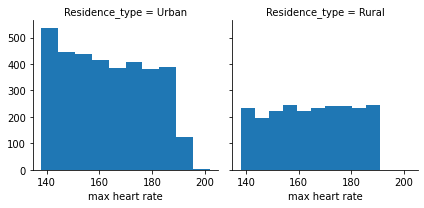

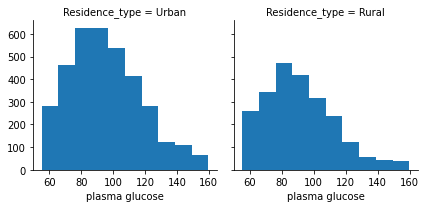

...

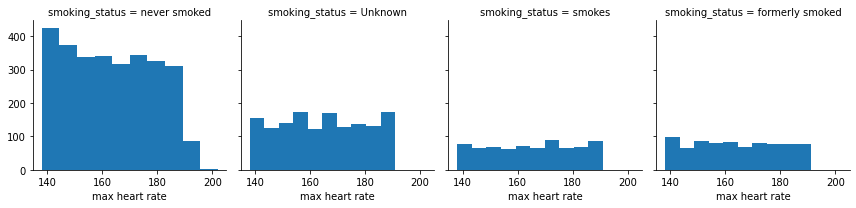

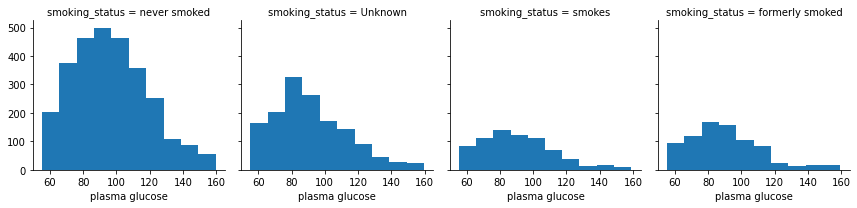

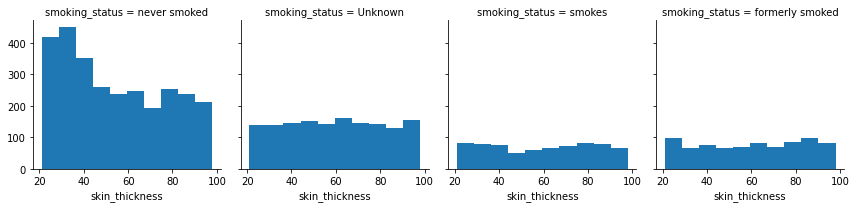

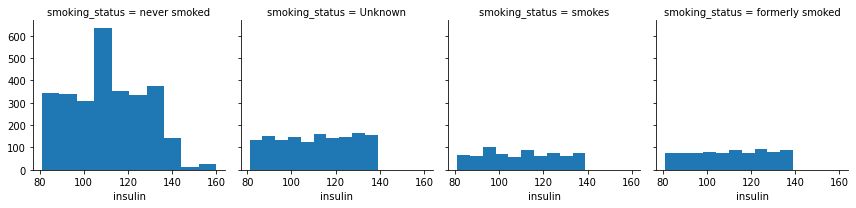

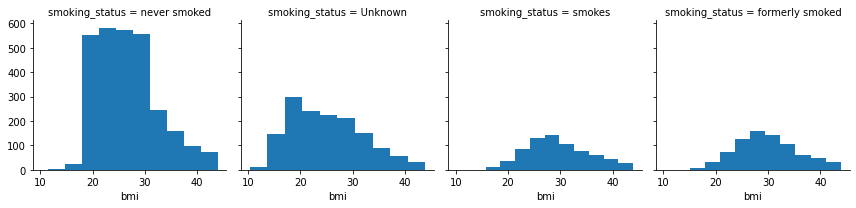

In [256]:
for i in cols7:
    for j in cols8:
        b=sns.FacetGrid(data=df,col=i)
        b.map(plt.hist,j)
        plt.show()

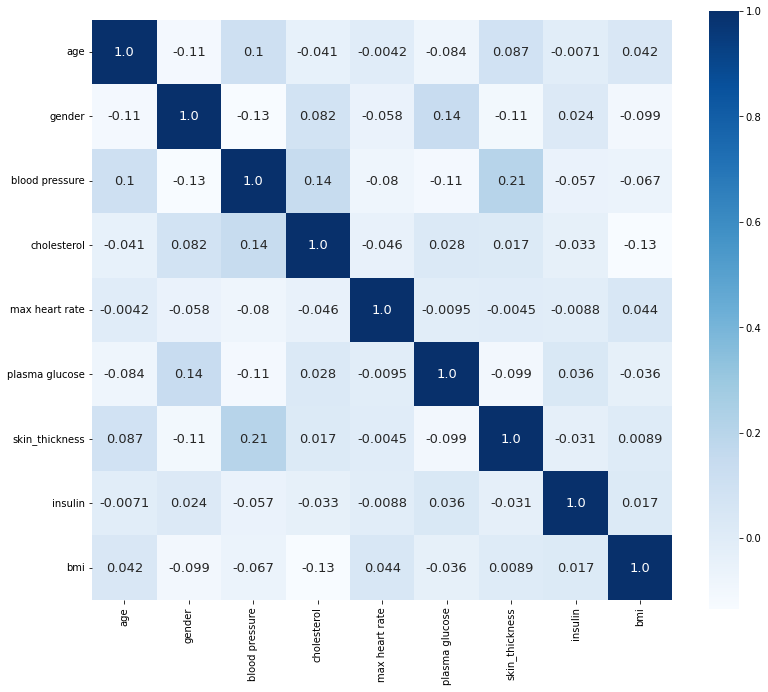

In [257]:
plt.figure(figsize=(13,11))
sns.heatmap(df.corr(numeric_only=True),annot=True,square=True,cbar=True,annot_kws={'size':13},fmt='.2',cmap='Blues')
plt.show()

In [258]:
df2=df[['blood pressure','skin_thickness']]

In [259]:
scaler=StandardScaler()

In [260]:
df2=scaler.fit_transform(df2)

In [261]:
df2

array([[ 2.48170114, -0.43399909],
       [ 1.4297669 , -0.2588349 ],
       [ 2.00354921,  1.44901597],
       ...,
       [ 0.712539  , -1.48498424],
       [ 0.90379978, -0.69674538],
       [ 0.80816939,  0.00391139]])

In [262]:
k=range(1,11)
inertia=[]
for i in k:
    kmeans=KMeans(n_clusters=i,init='k-means++')
    kmeans.fit(df2)
    inertia.append(kmeans.inertia_)

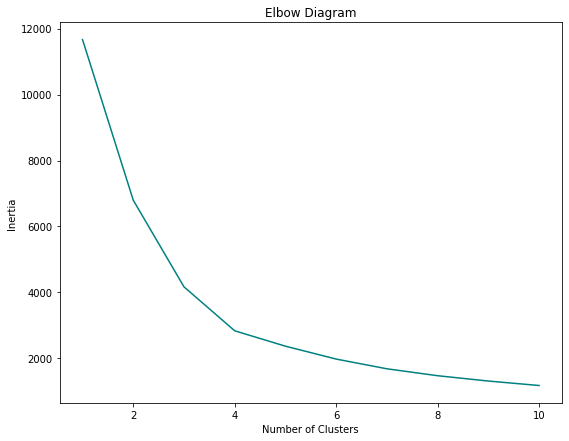

In [263]:
plt.figure(figsize=(9,7))
plt.plot(k,inertia,color='teal')
plt.title('Elbow Diagram')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()

In [264]:
model=KMeans(n_clusters=4,init='k-means++')
predicted=model.fit_predict(df2)

In [265]:
predicted

array([1, 1, 2, ..., 1, 1, 1])

In [266]:
df3=df.copy()

In [267]:
df3.head()

,age,gender,blood pressure,cholesterol,max heart rate,plasma glucose,skin_thickness,insulin,bmi,Residence_type,smoking_status
1,49.0,0.0,160.0,180.0,156.0,75.0,47.0,90.0,18.0,Urban,never smoked
3,48.0,0.0,138.0,214.0,156.0,72.0,51.0,118.0,18.0,Urban,never smoked
4,54.0,1.0,150.0,195.0,156.0,108.0,90.0,83.0,21.0,Urban,never smoked
7,54.0,1.0,110.0,208.0,142.0,124.0,82.0,103.0,19.0,Urban,never smoked
8,37.0,1.0,140.0,207.0,142.0,84.0,67.0,120.0,22.0,Urban,never smoked


In [268]:
df3=pd.get_dummies(data=df3,columns=['Residence_type','smoking_status'],drop_first=True,dtype=int)

In [269]:
df3.head()

,age,gender,blood pressure,cholesterol,max heart rate,plasma glucose,skin_thickness,insulin,bmi,Residence_type_Urban,smoking_status_formerly smoked,smoking_status_never smoked,smoking_status_smokes
1,49.0,0.0,160.0,180.0,156.0,75.0,47.0,90.0,18.0,1,0,1,0
3,48.0,0.0,138.0,214.0,156.0,72.0,51.0,118.0,18.0,1,0,1,0
4,54.0,1.0,150.0,195.0,156.0,108.0,90.0,83.0,21.0,1,0,1,0
7,54.0,1.0,110.0,208.0,142.0,124.0,82.0,103.0,19.0,1,0,1,0
8,37.0,1.0,140.0,207.0,142.0,84.0,67.0,120.0,22.0,1,0,1,0


In [270]:
pca=PCA(n_components=2)
principal_components=pca.fit_transform(df3)
pca_df=pd.DataFrame(data=principal_components,columns=['PCA1','PCA2'])
pca_df

,PCA1,PCA2
0,-30.003483,-10.686815
1,-23.044539,-11.128773
2,-42.055789,36.444518
3,-8.185103,42.412458
4,-28.781247,6.563582
...,...,...
5828,-12.301117,15.981625
5829,11.977179,-22.526688
5830,28.454621,12.619428
5831,-8.049954,-11.584280


In [271]:
pca_df['Cluster']=predicted
pca_df

,PCA1,PCA2,Cluster
0,-30.003483,-10.686815,1
1,-23.044539,-11.128773,1
2,-42.055789,36.444518,2
3,-8.185103,42.412458,3
4,-28.781247,6.563582,2
...,...,...,...
5828,-12.301117,15.981625,2
5829,11.977179,-22.526688,1
5830,28.454621,12.619428,1
5831,-8.049954,-11.584280,1


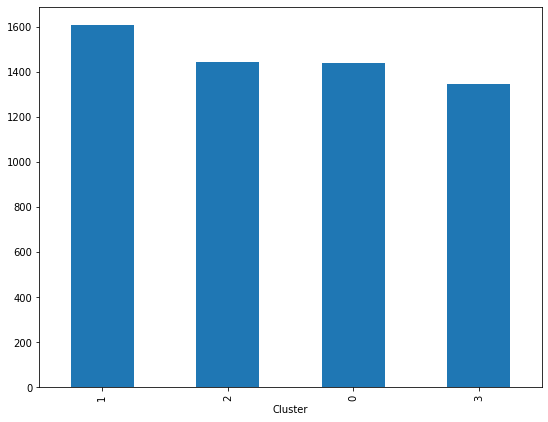

In [272]:
pca_df['Cluster'].value_counts().plot(kind='bar',figsize=(9,7))
plt.show()

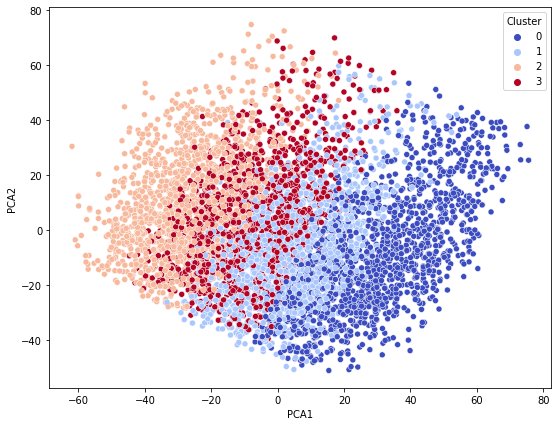

In [273]:
plt.figure(figsize=(9,7))
sns.scatterplot(data=pca_df,x='PCA1',y='PCA2',hue='Cluster',palette='coolwarm')
plt.show()

In [274]:
df['Cluster']=predicted

In [275]:
df.head()

,age,gender,blood pressure,cholesterol,max heart rate,plasma glucose,skin_thickness,insulin,bmi,Residence_type,smoking_status,Cluster
1,49.0,0.0,160.0,180.0,156.0,75.0,47.0,90.0,18.0,Urban,never smoked,1
3,48.0,0.0,138.0,214.0,156.0,72.0,51.0,118.0,18.0,Urban,never smoked,1
4,54.0,1.0,150.0,195.0,156.0,108.0,90.0,83.0,21.0,Urban,never smoked,2
7,54.0,1.0,110.0,208.0,142.0,124.0,82.0,103.0,19.0,Urban,never smoked,3
8,37.0,1.0,140.0,207.0,142.0,84.0,67.0,120.0,22.0,Urban,never smoked,2


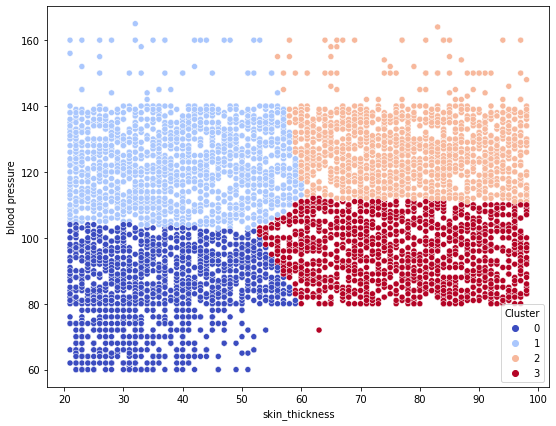

In [276]:
plt.figure(figsize=(9,7))
sns.scatterplot(data=df,x='skin_thickness',y='blood pressure',hue='Cluster',palette='coolwarm')
plt.show()

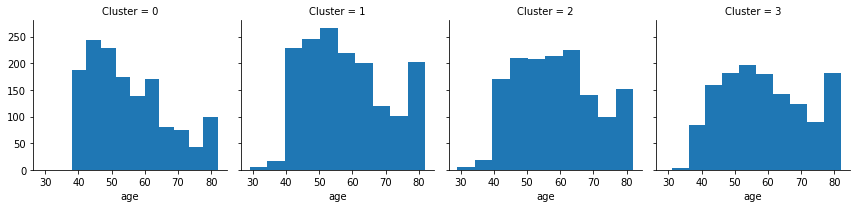

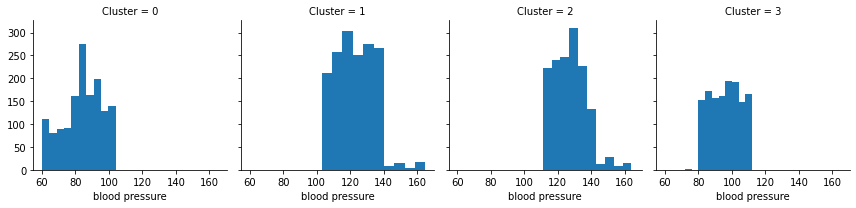

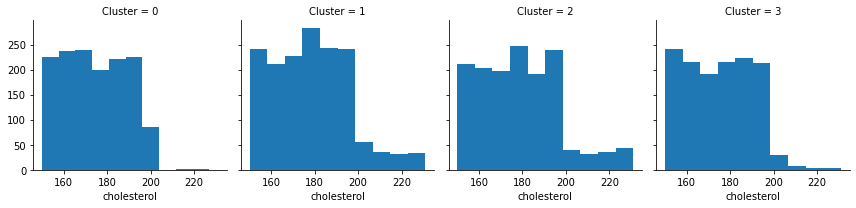

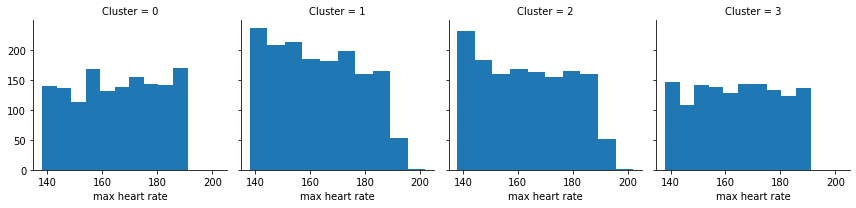

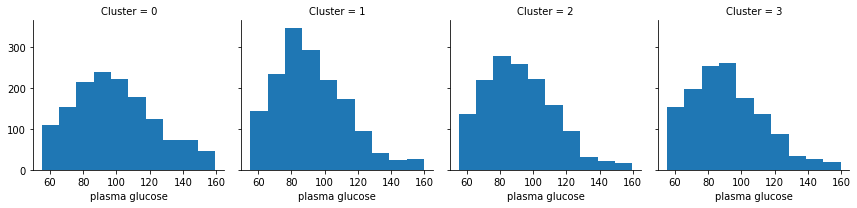

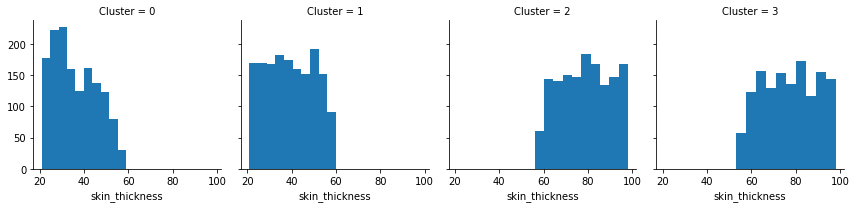

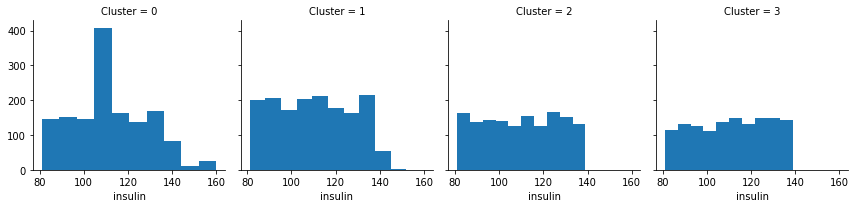

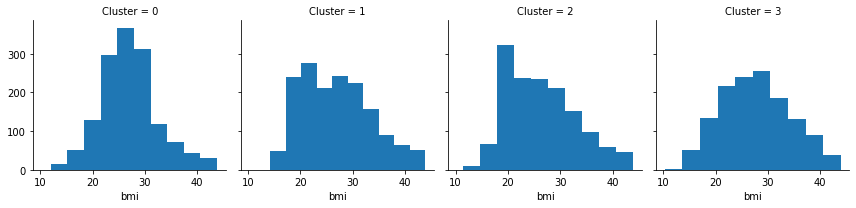

In [283]:
for column in cols8:
    b=sns.FacetGrid(data=df,col='Cluster')
    b.map(plt.hist,column)
    plt.show()

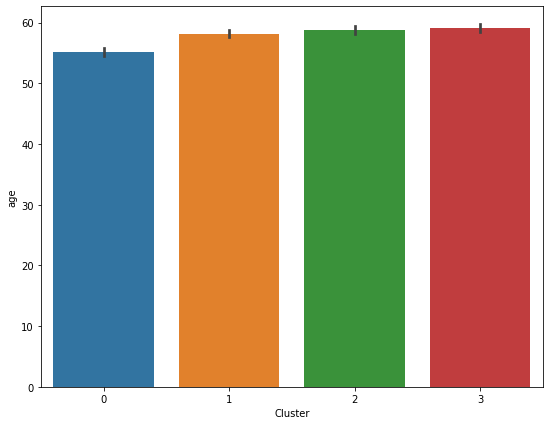

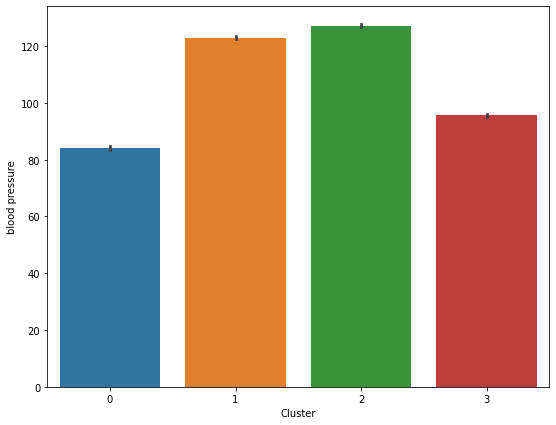

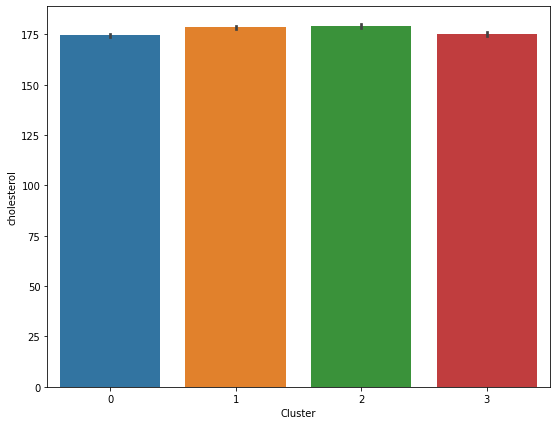

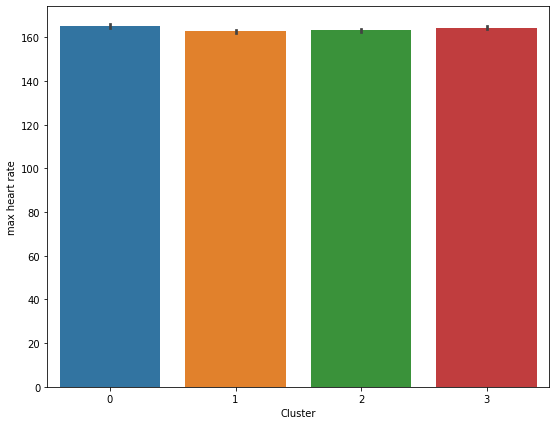

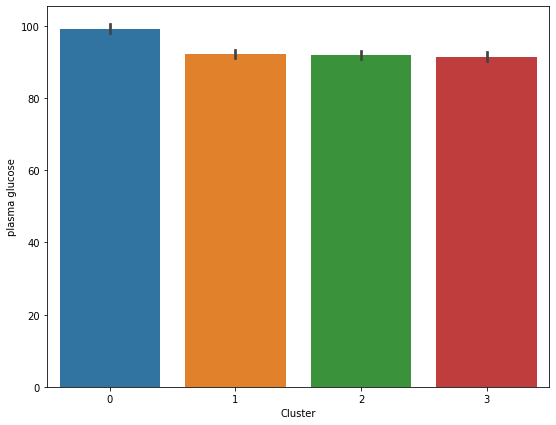

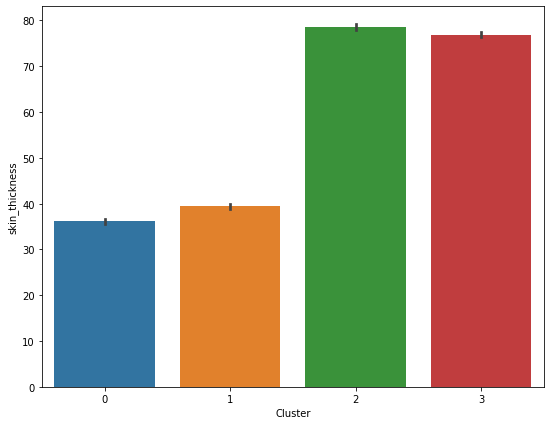

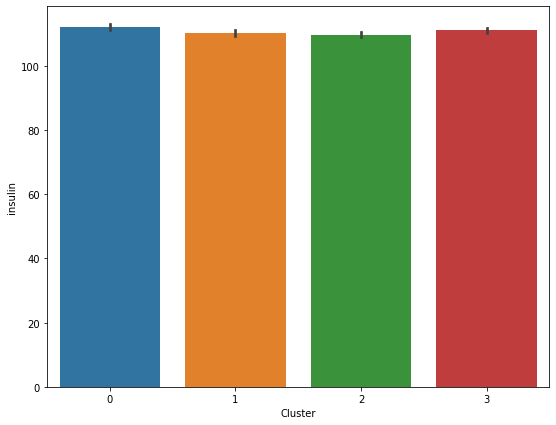

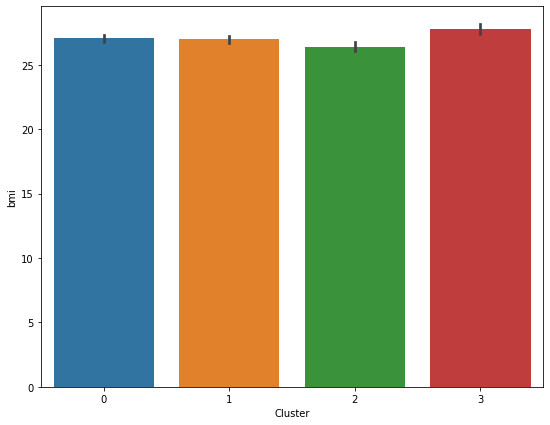

In [284]:
for column in cols8:
    plt.figure(figsize=(9,7))
    sns.barplot(data=df,x='Cluster',y=column)
    plt.show()